In [63]:
import pandas as pd
import os
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import bootstrap
import h5py

from utils import *

In [64]:
config = yaml.safe_load(open('/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/beads_in_zebrafish/magnetic_tweezers_SD/config.yml'))

filepath_measurements_info = config['filepath_measurements_info']
dir_plots = os.path.join(config['dir_parent'], '3_plots')  # Folder for saving plots
dir_analysis = os.path.join(config['dir_parent'], '2_analysis')  # Folder for saving analysis results
recalculate = config['recalculate']  # Whether to recalculate measurements if they already exist
pix_size = config['pix_size'] 
dt = config['dt']  # Time step in seconds

In [65]:
# load data
df_results_all = pd.read_csv('/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/3_plots/results/results_material_properies.csv')
df_results_all.head(10)

,Unnamed: 0,EXPERIMENT,EMBRYO,TRACK_ID,PULSE_NUMBER,MT_STATUS,AVG_FORCE,k,eta_1,eta_2,...,R_SQUARED_KV,fit_divisible,relax_too_much,rising_dif,relaxing_dif,rising_dif_norm,rising_dif_norm_inverse,relative_dif,tau_r,a
0,0,20240621s01p01t02,20240621s01p01,2,2,n,43.731777,21.266657,46.497273,28.501293,...,0.779351,True,False,9.321315,-1.229614,0.213147,4.691589,0.131914,1.093197,0.206218
1,1,20240621s01p01t02,20240621s01p01,2,3,n,46.900588,49.835248,8.671300,119.124535,...,-0.755094,True,False,2.772072,0.062041,0.059105,16.918965,-0.022381,0.087000,0.346914
2,2,20240621s01p01t02,20240621s01p01,2,4,n,47.988138,48.545614,17.507480,1000000.000000,...,0.241135,True,True,1.178596,-0.737468,0.024560,40.716368,0.625717,0.180320,0.999782
3,3,20240621s01p01t02,20240621s01p01,2,5,n,51.241256,28.920986,24.023393,83.857799,...,0.002447,True,False,4.447798,-1.271949,0.086801,11.520589,0.285973,0.415328,0.390795
4,4,20240621s01p01t02,20240621s01p01,2,6,n,55.305090,27.507318,8.101514,36.960042,...,-0.079466,True,False,8.230044,-0.528226,0.148812,6.719902,0.064183,0.147261,0.229933
5,5,20240621s01p01t02,20240621s01p01,2,7,n,60.005093,62.240904,31.915372,32.110504,...,0.841201,True,False,9.598344,-0.272391,0.159959,6.251609,0.028379,0.256386,0.102840
6,6,20240621s01p01t02,20240621s01p01,2,8,n,68.416495,22.052496,118.447174,20.964195,...,0.755685,True,False,17.145380,-0.873600,0.250603,3.990375,0.050953,2.685573,0.107027
7,7,20240621s01p01t02,20240621s01p01,2,9,n,76.284062,70.140105,43.904752,782.263367,...,0.046384,True,False,1.615231,-0.373100,0.021174,47.227965,0.230989,0.312979,0.712358
8,8,20240621s01p01t02,20240621s01p01,2,10,n,86.317138,39.570793,17.552681,38.692180,...,0.362772,True,False,11.719017,-0.699765,0.135767,7.365561,0.059712,0.221788,0.178496
9,9,20240621s01p01t02,20240621s01p01,2,11,n,96.131588,57.878093,24.160225,300.488156,...,-2.310617,True,False,2.934055,-0.602346,0.030521,32.764071,0.205295,0.208716,0.535682


In [66]:
df_results_all = df_results_all.sort_values(by='MT_STATUS', ascending=False)

df_results_all['elastic_viscous_ratio'] = (df_results_all['AVG_FORCE'] / df_results_all['k'] * (1 - np.exp(- df_results_all['k']  * df_results_all['t_1']  / df_results_all['eta_1'] ))) / (df_results_all['AVG_FORCE'] * df_results_all['t_1'] / df_results_all['eta_2'])

print(df_results_all.columns)

Index(['Unnamed: 0', 'EXPERIMENT', 'EMBRYO', 'TRACK_ID', 'PULSE_NUMBER',
       'MT_STATUS', 'AVG_FORCE', 'k', 'eta_1', 'eta_2', 'k_err', 'eta_1_err',
       'eta_2_err', 'k_KV', 'eta_KV', 'k_KV_err', 'eta_KV_err', 't_1',
       'R_SQUARED', 'R_SQUARED_KV', 'fit_divisible', 'relax_too_much',
       'rising_dif', 'relaxing_dif', 'rising_dif_norm',
       'rising_dif_norm_inverse', 'relative_dif', 'tau_r', 'a',
       'elastic_viscous_ratio'],
      dtype='object')


# General overview

In [67]:
N_tracks = len(df_results_all)
N_relaxed_too_much = len(df_results_all[df_results_all['relax_too_much'] == True])
N_not_differentiable = len(df_results_all[df_results_all['fit_divisible'] == False])

print(f'We have in total {N_tracks} tracks. ')
print(f'Out of those, we have {N_relaxed_too_much} tracks that relaxed to a value below zero. We do not take those into account.')
print(f'Furthermore, we have {N_not_differentiable} tracks that are not differentiable. We do not take those into account either.\n')

N_R_low = len(df_results_all[df_results_all['R_SQUARED'] < 0.8])
print(f'Number of fits with R^2 < 0.5: {N_R_low}')

We have in total 772 tracks. 
Out of those, we have 79 tracks that relaxed to a value below zero. We do not take those into account.
Furthermore, we have 13 tracks that are not differentiable. We do not take those into account either.

Number of fits with R^2 < 0.5: 209


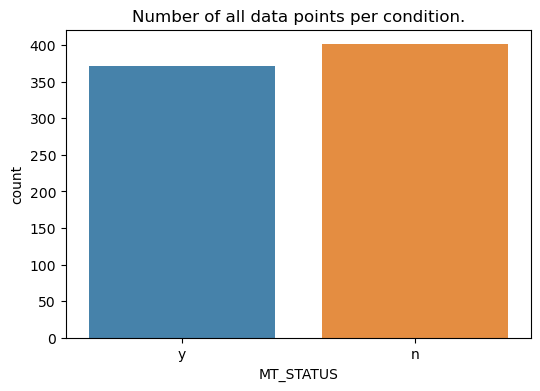

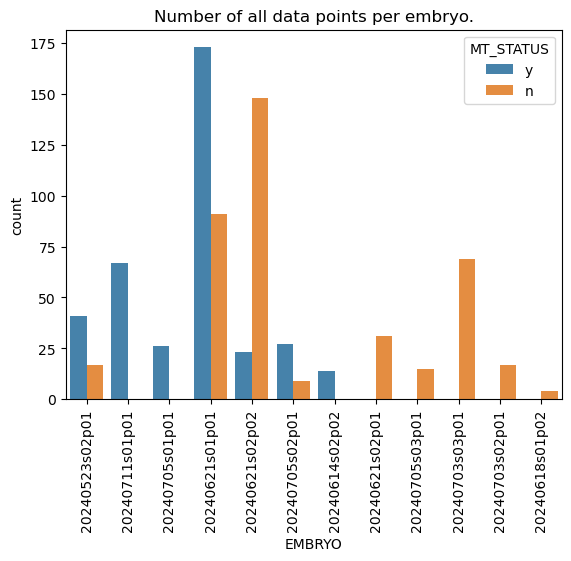

In [68]:
fig = plt.figure(figsize=(6, 4))
# Second subplot: Summary statistics

sns.countplot(data=df_results_all, x='MT_STATUS', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of all data points per condition.')
plt.show()

sns.countplot(data=df_results_all, x='EMBRYO', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of all data points per embryo.')
plt.xticks(rotation=90)
plt.show()

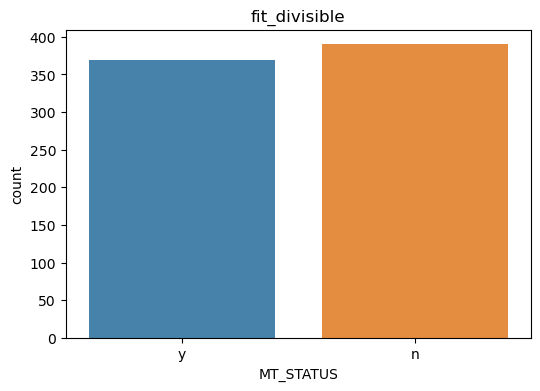

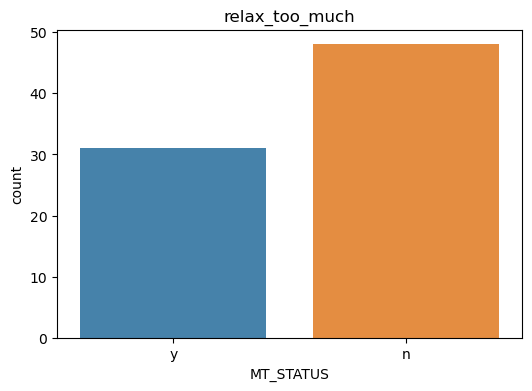

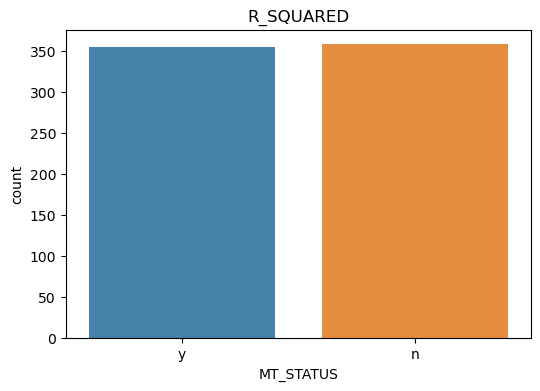

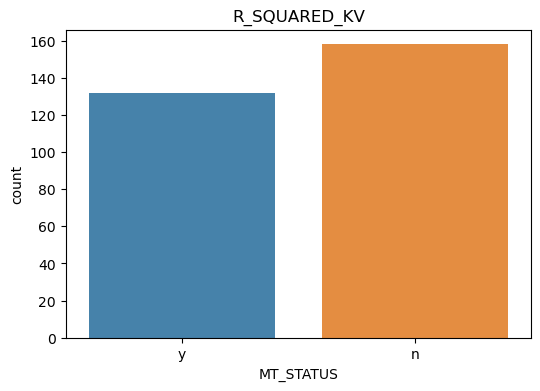

In [69]:
comparissons = ['fit_divisible', 'relax_too_much', 'R_SQUARED', 'R_SQUARED_KV']

boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for comp in comparissons:
    fig = plt.figure(figsize=(6, 4))
    # Second subplot: Summary statistics
    sns.countplot(data=df_results_all[df_results_all[comp]>0.5], x='MT_STATUS', hue='MT_STATUS', alpha=0.9)
    plt.title(f'{comp}')

In [70]:
r_sq_min = 0.5
print(f'Number of successful fits with Jeffreys model: ',  sum(df_results_all['R_SQUARED']>r_sq_min))
print(f'Number of successful fits with Kelvin Voigt model: ', sum(df_results_all['R_SQUARED_KV']>r_sq_min))
print(f'Number of better fits with KV model instead of Jeffreys: ', sum(df_results_all['R_SQUARED_KV']>df_results_all['R_SQUARED']))

print('KV fits better in M-phase: ', len(df_results_all[(df_results_all['MT_STATUS'] == 'n')&(df_results_all['R_SQUARED_KV']>df_results_all['R_SQUARED'])&((df_results_all['R_SQUARED_KV']>r_sq_min))]))
print('KV fits better in interphase: ', len(df_results_all[(df_results_all['MT_STATUS'] == 'y')&(df_results_all['R_SQUARED_KV']>df_results_all['R_SQUARED'])&((df_results_all['R_SQUARED_KV']>r_sq_min))]))

Number of successful fits with Jeffreys model:  713
Number of successful fits with Kelvin Voigt model:  290
Number of better fits with KV model instead of Jeffreys:  108
KV fits better in M-phase:  36
KV fits better in interphase:  34


In [71]:
r_sq_min = 0.5
# filter out the unreasonable tracks
df_results_filtered = df_results_all[
    (df_results_all['R_SQUARED'] >= r_sq_min) &
    (df_results_all['relax_too_much'] == False) &
    (df_results_all['fit_divisible'] == True) &
    (df_results_all['k_err']/df_results_all['k'] < 1) &
    (df_results_all['eta_1_err']/df_results_all['eta_1'] < 1) &
    (df_results_all['eta_2_err']/df_results_all['eta_2'] < 1)  
]

print(f'We are left with {len(df_results_filtered)} tracks after filtering.\n')

print(f'Percentage of usable tracks in M-phase: {len(df_results_filtered[df_results_filtered["MT_STATUS"] == "n"])/len(df_results_all[df_results_all["MT_STATUS"] == "n"])*100:.2f}%')
print(f'Percentage of usable tracks in interphase: {len(df_results_filtered[df_results_filtered["MT_STATUS"] == "y"])/len(df_results_all[df_results_all["MT_STATUS"] == "y"])*100:.2f}%')

We are left with 623 tracks after filtering.

Percentage of usable tracks in M-phase: 77.81%
Percentage of usable tracks in interphase: 83.83%


# The data that is still left after filtering 

We removed:
- the data with poor fits (R^2 lower than 0.5)
- the fits with very high errors for parameters
- the data that relaxes below 0 (this indicates some reorganization of the cytoplasm beyond the responce to the magnetic pulse)
- the data with practically non-differentiable fits (those would be "good" fits but not compatible with our physical model of the cytoplasm)


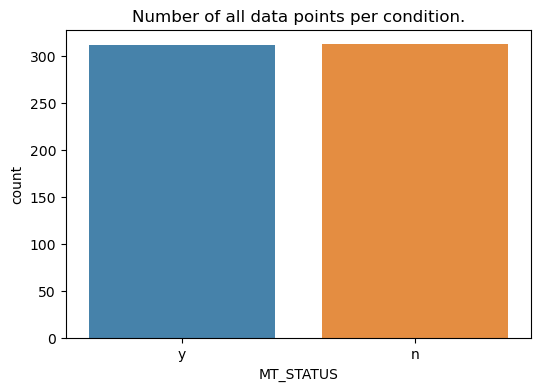

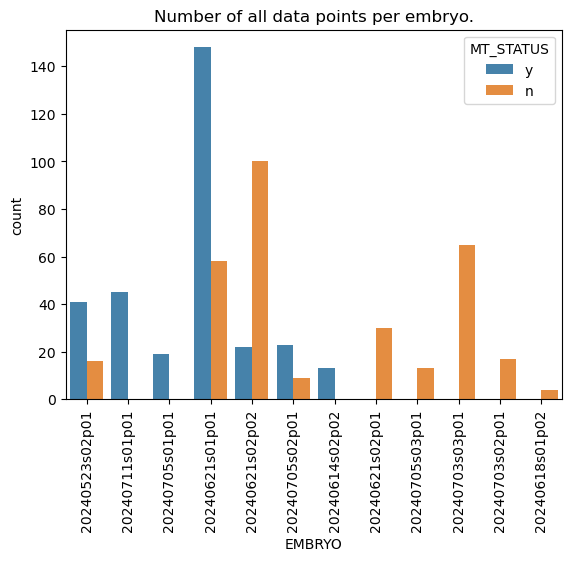

In [72]:
fig = plt.figure(figsize=(6, 4))
# Second subplot: Summary statistics

sns.countplot(data=df_results_filtered, x='MT_STATUS', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of all data points per condition.')
plt.show()

sns.countplot(data=df_results_filtered, x='EMBRYO', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of all data points per embryo.')
plt.xticks(rotation=90)
plt.show()

# All data groupped together

In [73]:
# All the parameters that we are interested in with their labels for plots:

params = ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'rising_dif', 'rising_dif_norm', 'relative_dif', 'a', 'tau_r']

labels = ['$\\kappa$ (pN/$\\mathrm{\\mu m}$)', '$\\gamma_1$ (pN s/$\\mathrm{\\mu m}$)', '$\\gamma_2$ (pN s/$\\mathrm{\\mu m}$)', 'Ratio between elastic and viscous deformation', 'Displacement ($\\mathrm{\\mu m}$)', 'Displacement / Force ($\\mathrm{\\mu m}$/s)', 'a = Relaxation / Displacement ', 'a', '$\\tau_R$']

mapping = {'y': 'Interphase', 'n': 'M-phase'}

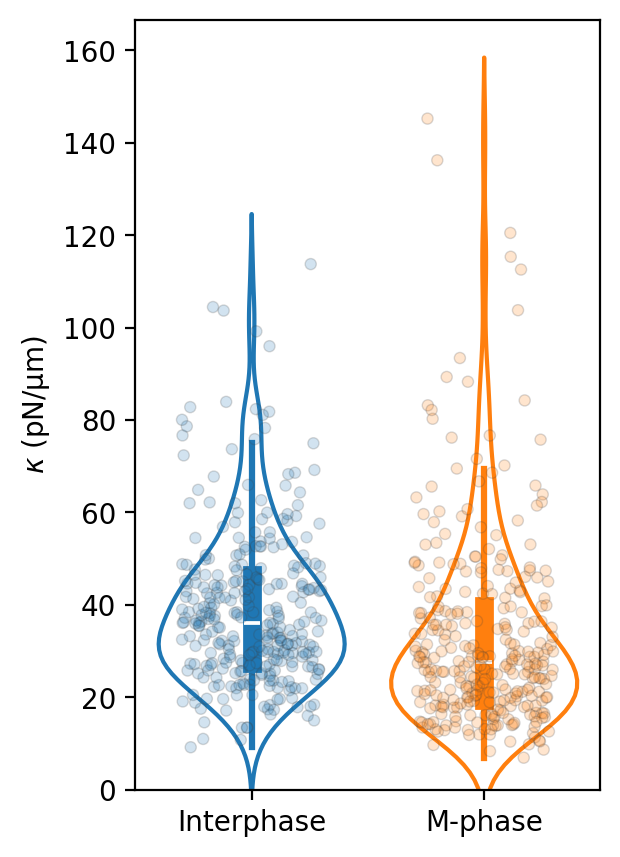

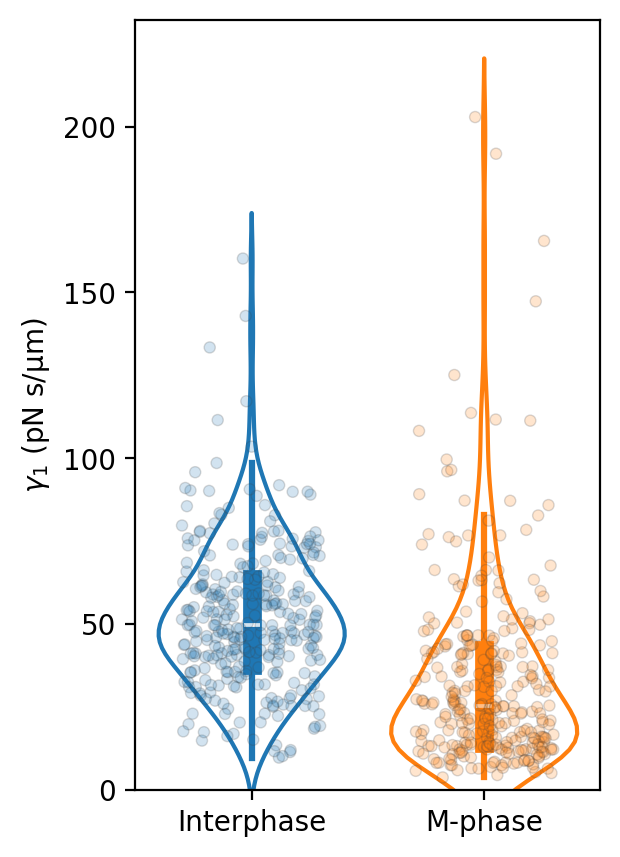

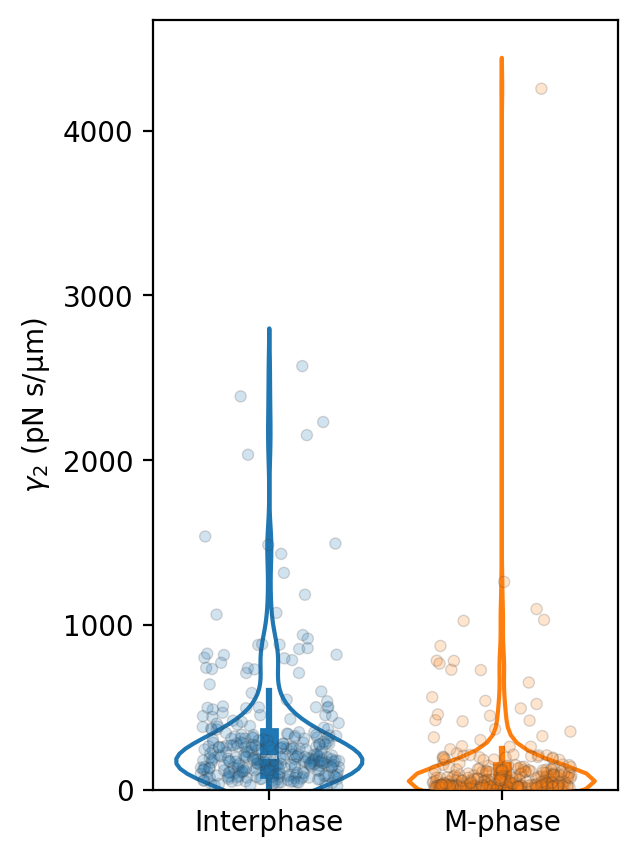

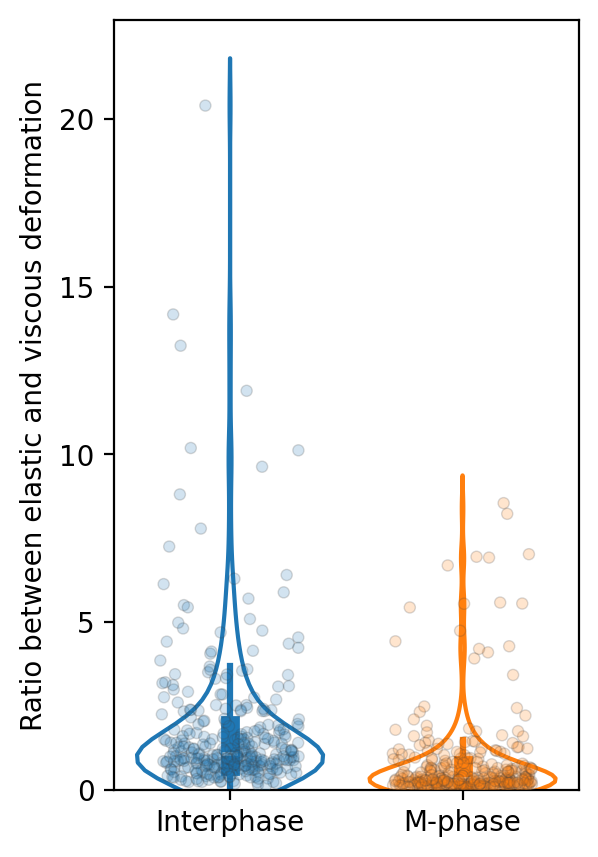

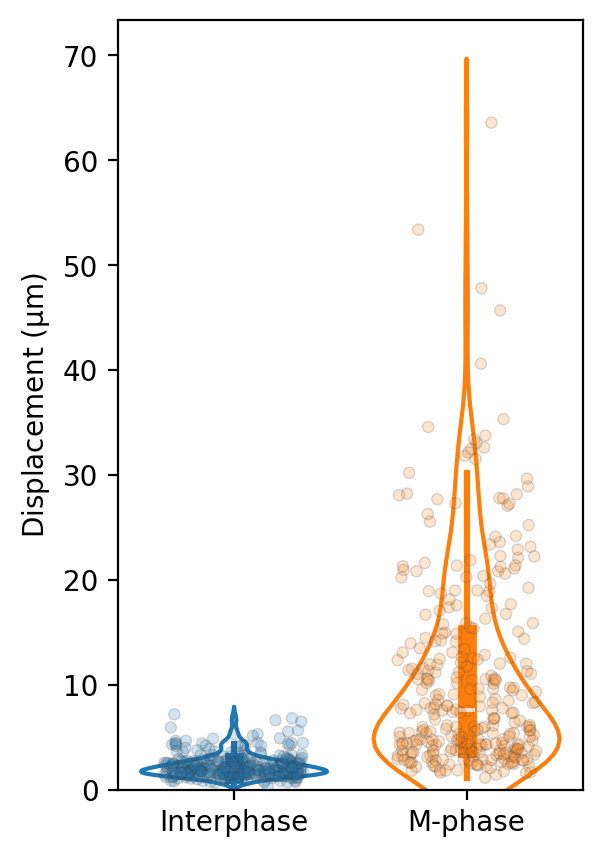

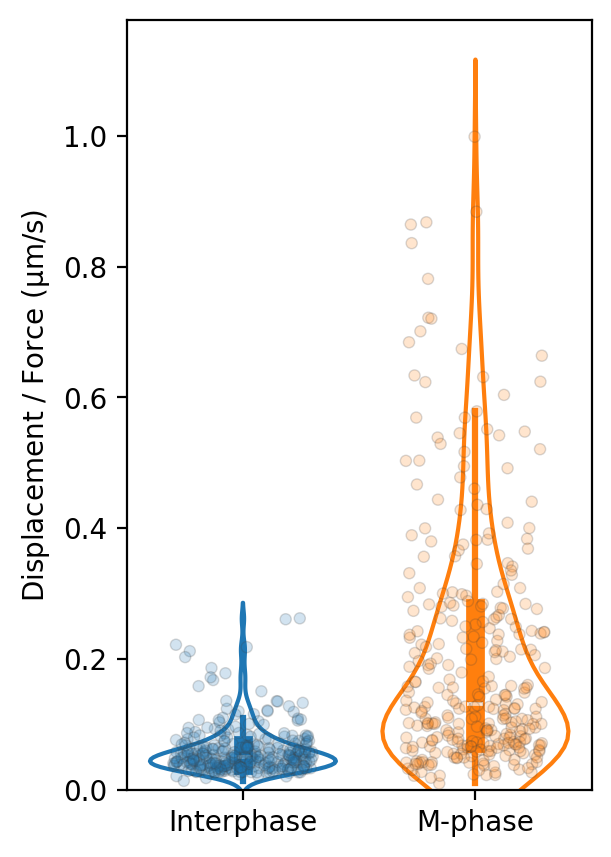

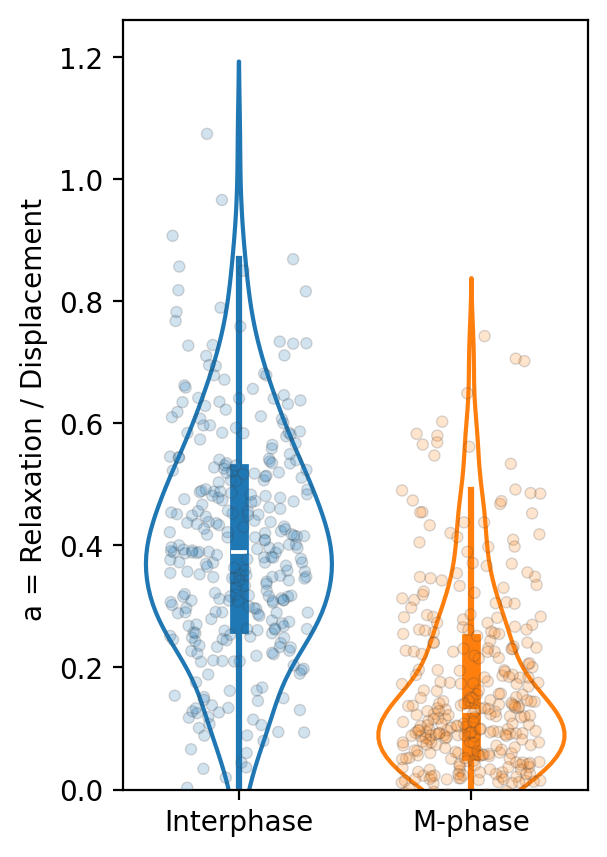

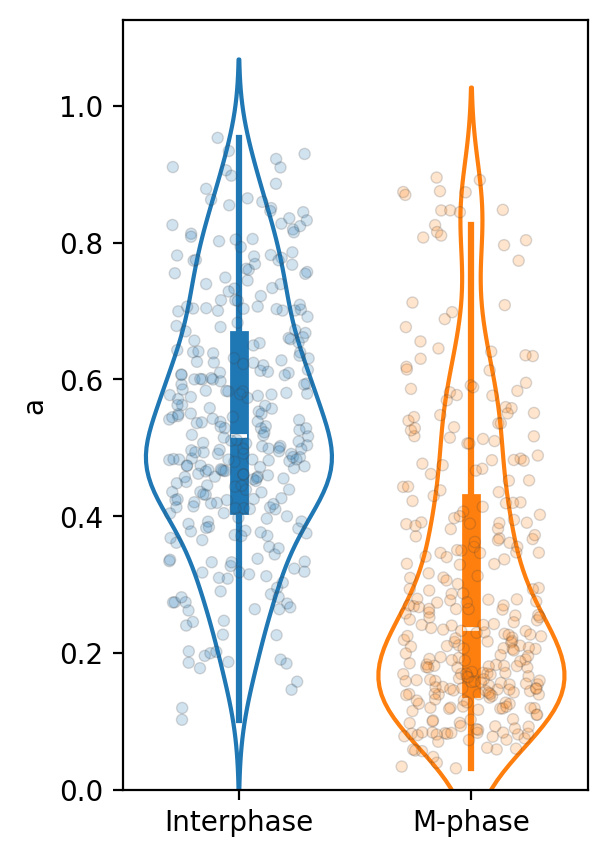

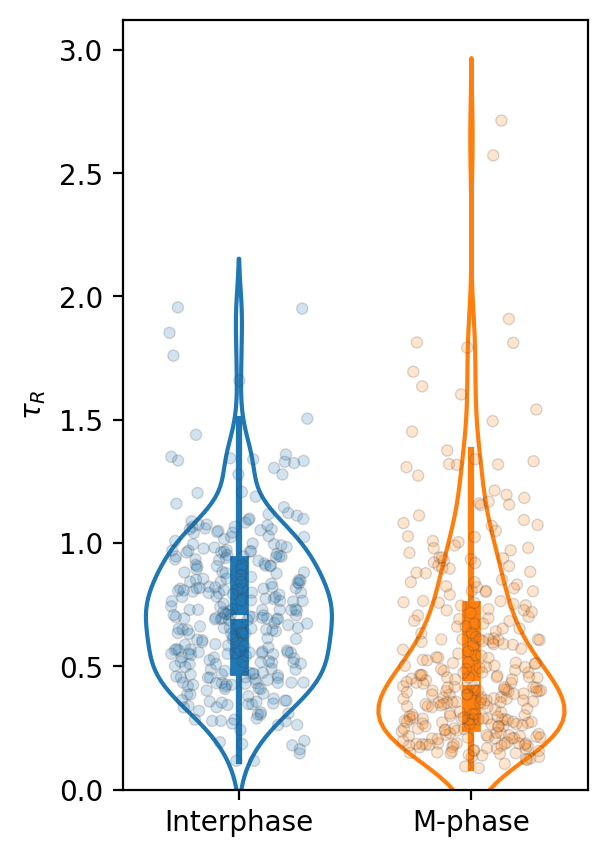

In [74]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(3, 5), dpi=200)
    # sns.boxplot(x='MT_STATUS', y=param, data=df_results_filtered, boxprops=boxprops, fliersize=0)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, jitter=0.3, alpha=0.2, linewidth=0.5, legend=False, size=4)
    sns.violinplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, fill=False)
    plt.ylabel(label)
    plt.xlabel('')
    plt.xticks(ticks = ['y', 'n'], labels=['Interphase', 'M-phase'])
    plt.ylim(bottom=0)
    # plt.yscale('log')
    plt.show()


# Clustered data

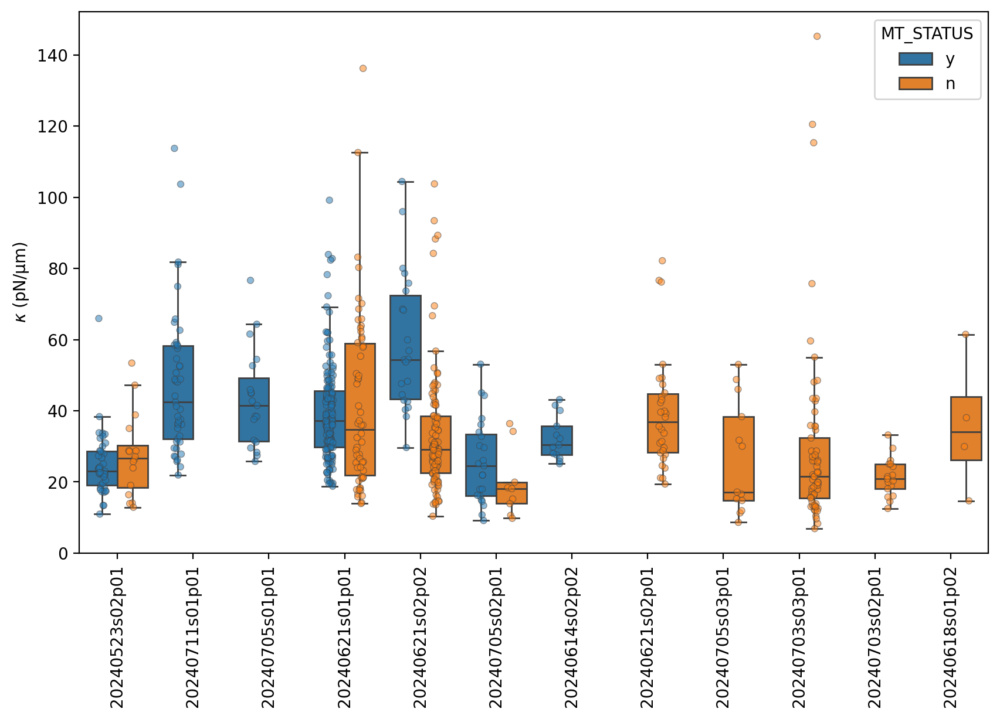

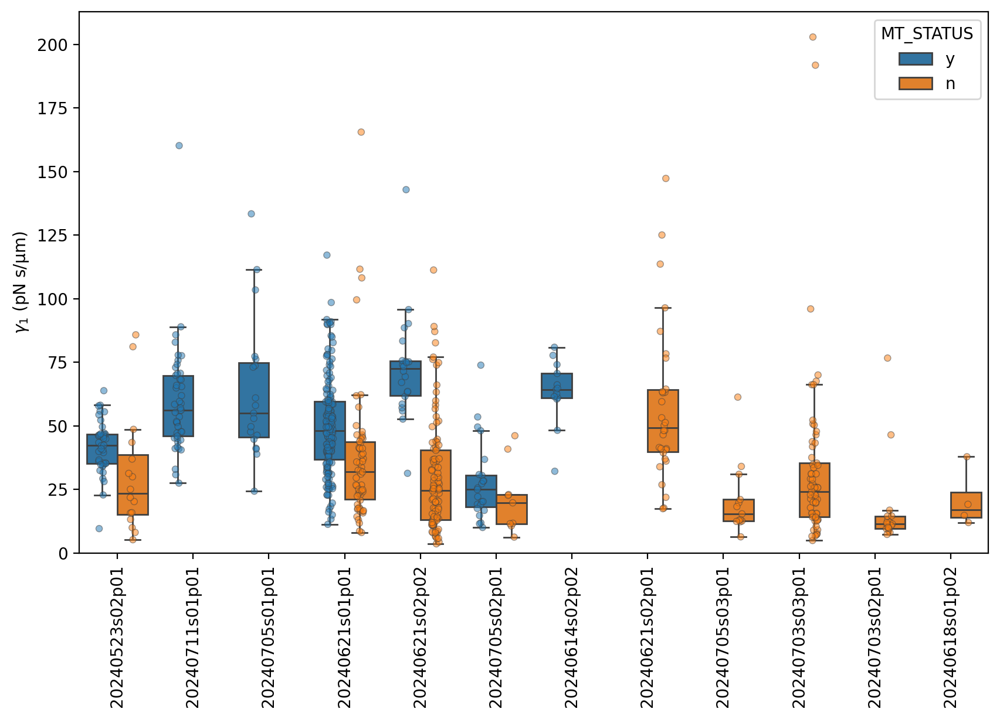

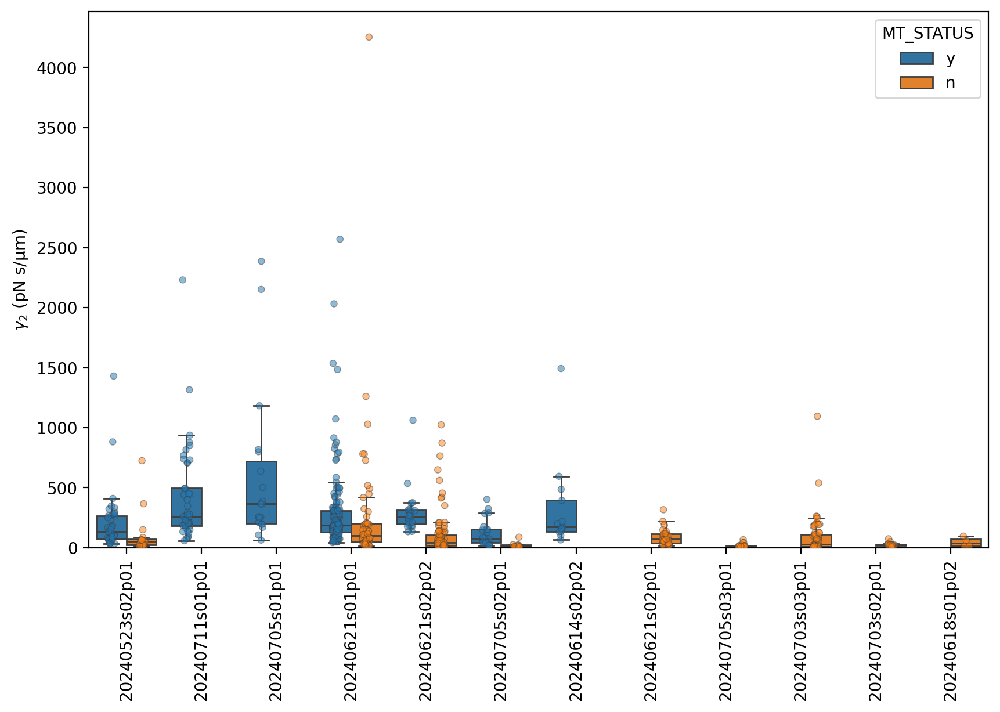

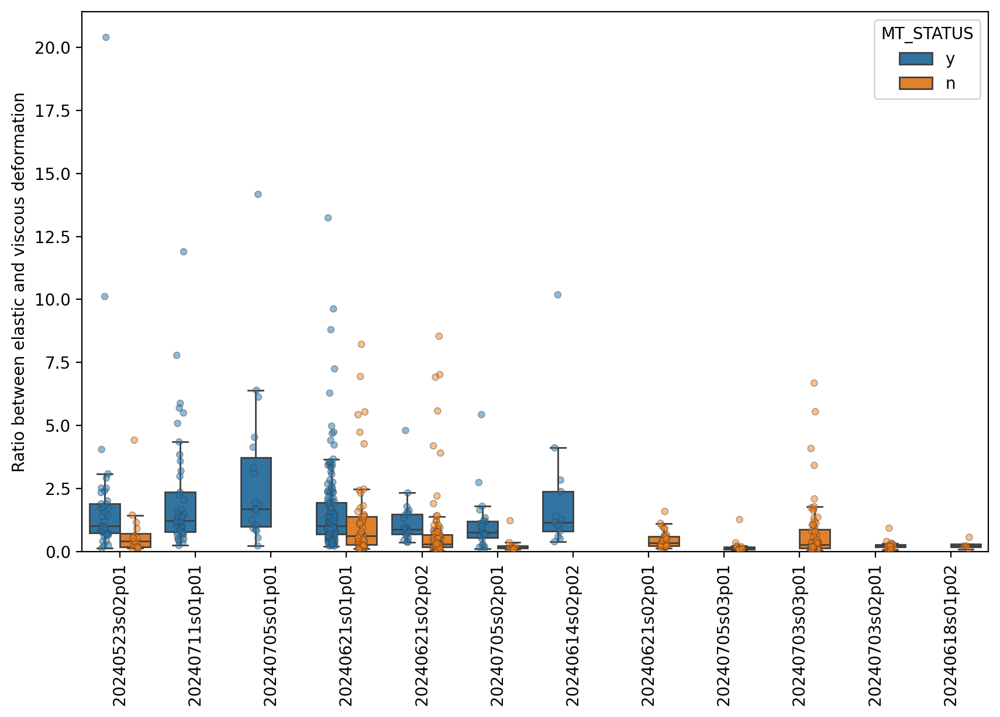

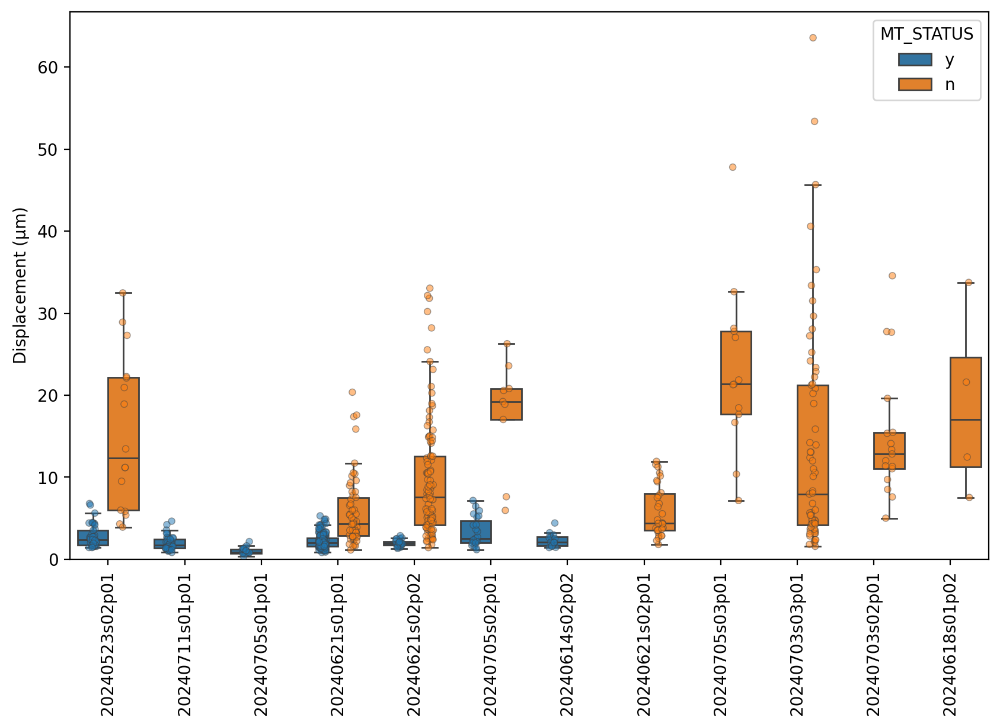

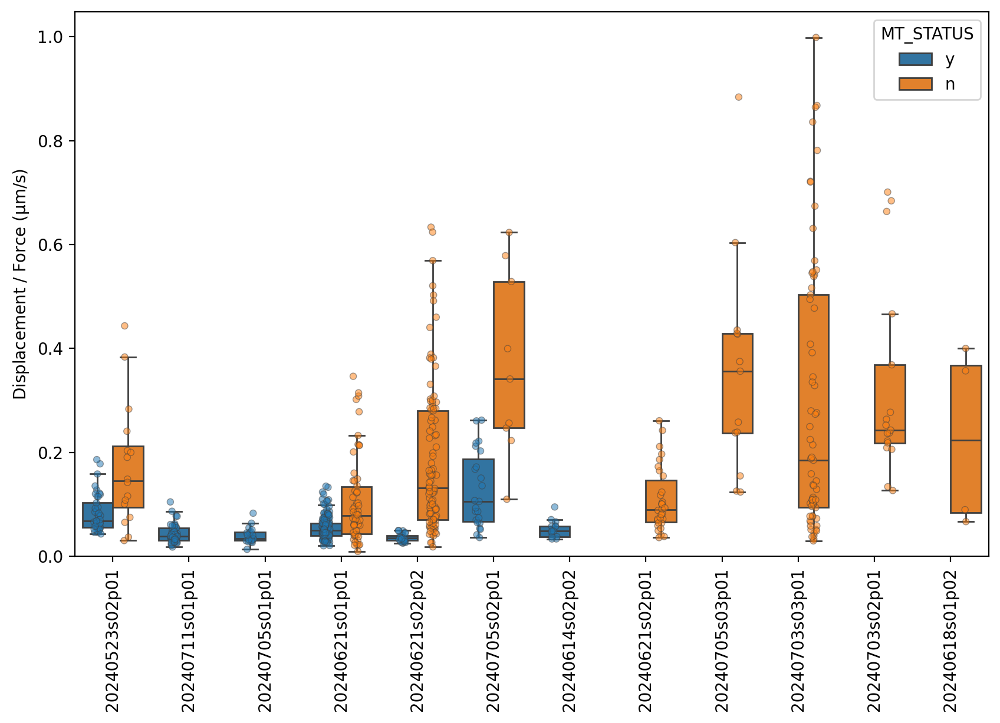

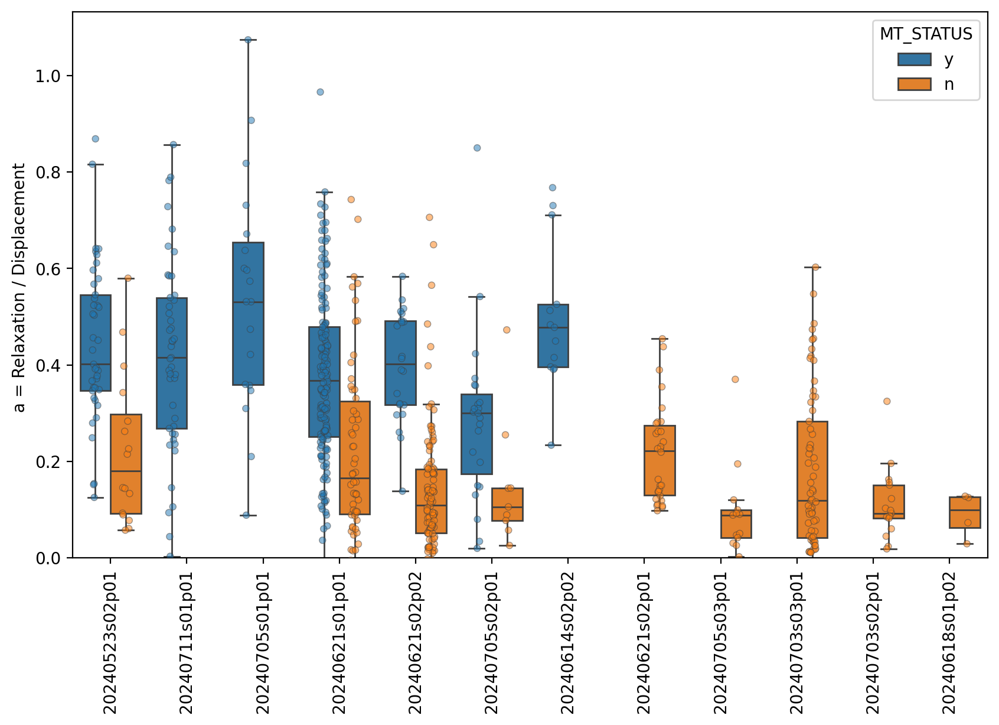

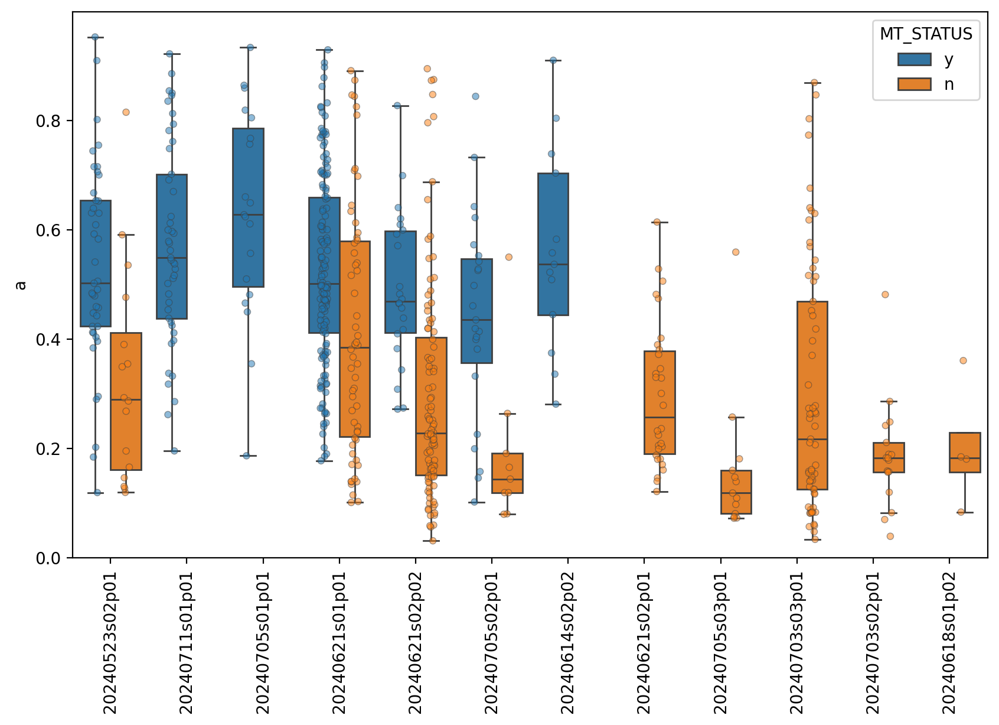

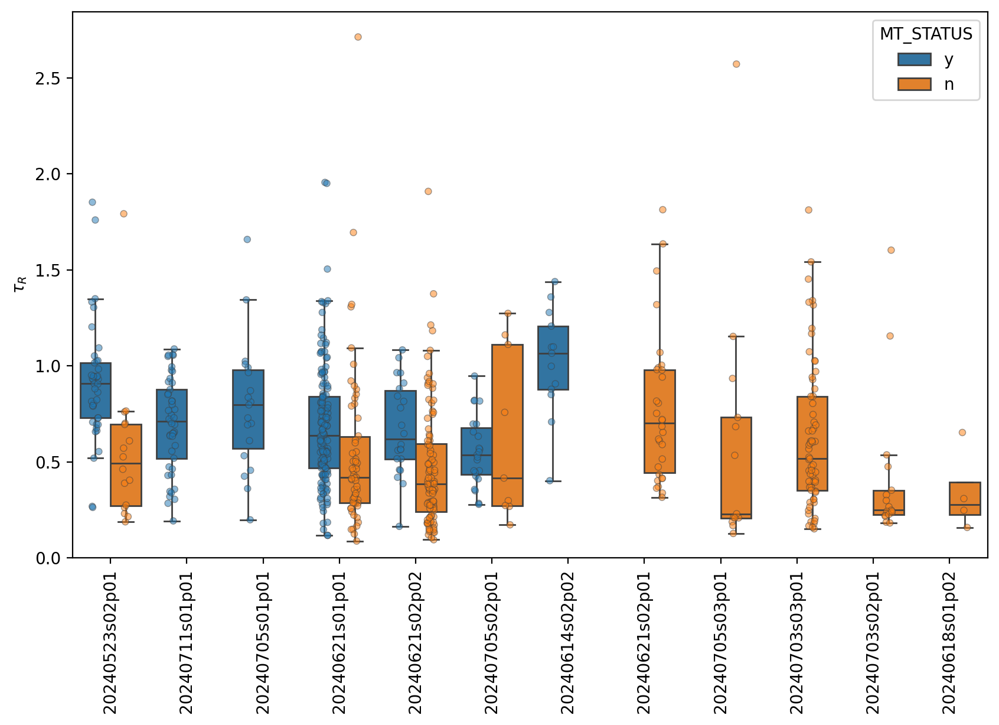

In [75]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df_results_filtered, fliersize=0)
    sns.stripplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df_results_filtered, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4)
    plt.xlabel('')
    plt.ylabel(label)
    plt.ylim(bottom=0)
    plt.xticks(rotation=90)
    plt.show()

# Binned by the pulse number

There seems to be no significant trend in the measurements from repetitive pulses. Although, there is a slight change from teh first pulse to the rest. 

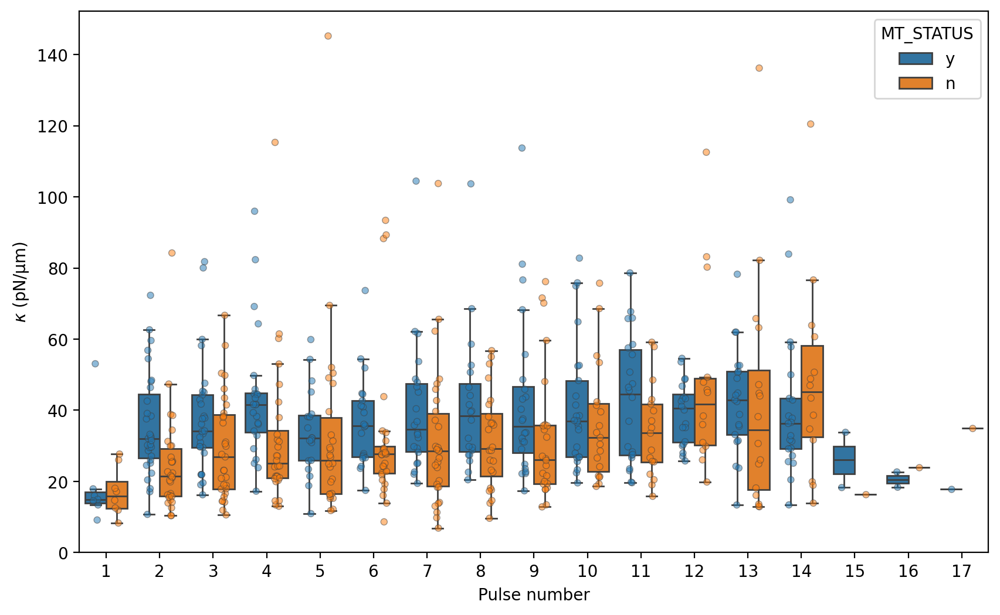

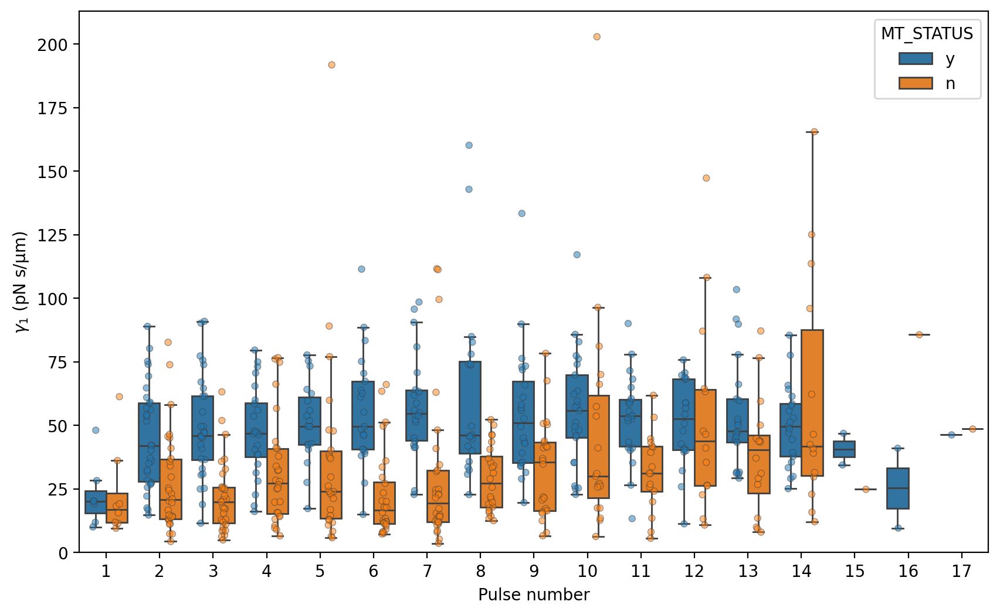

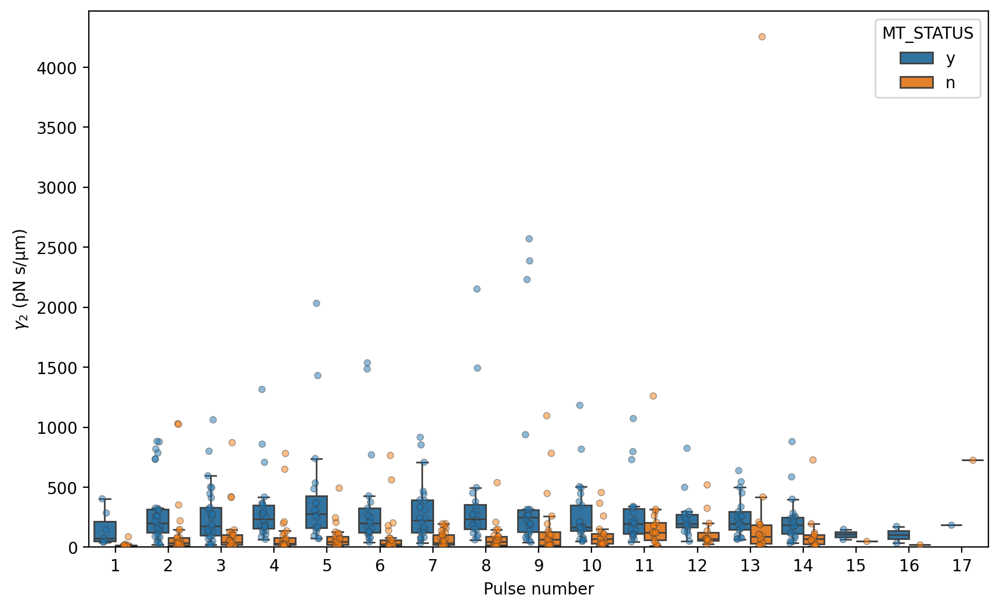

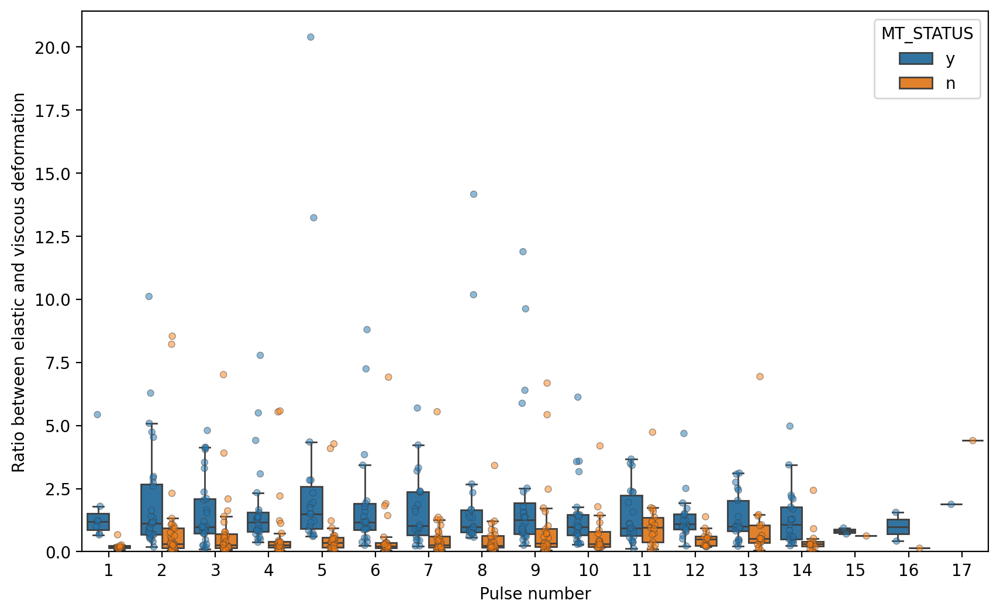

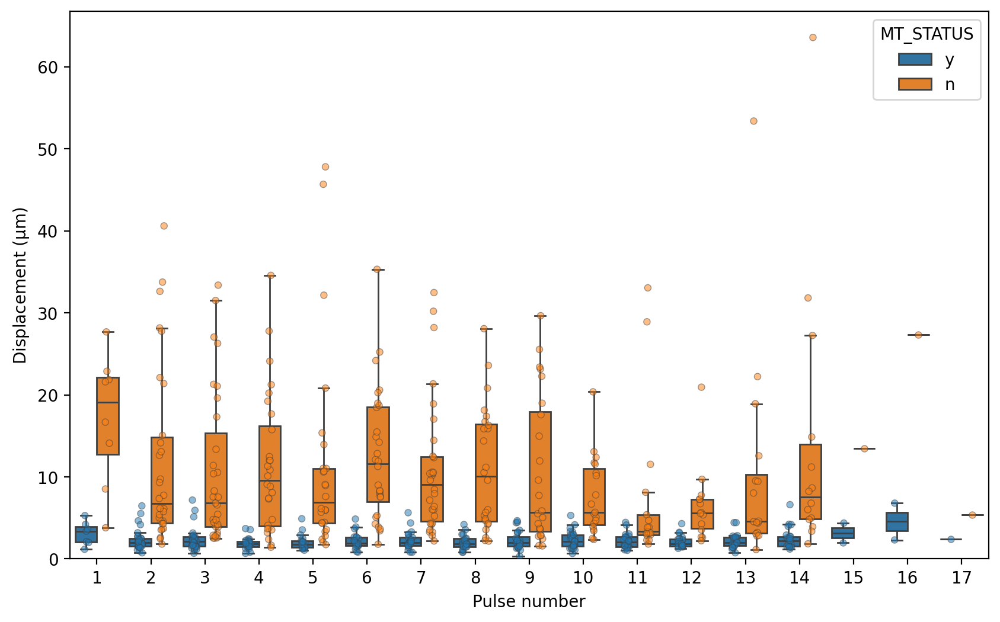

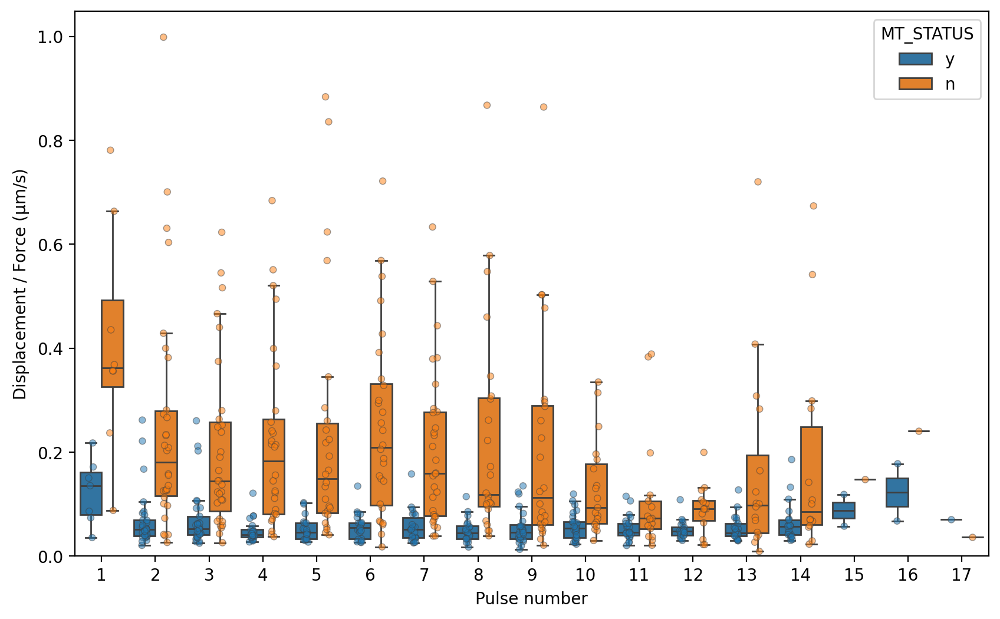

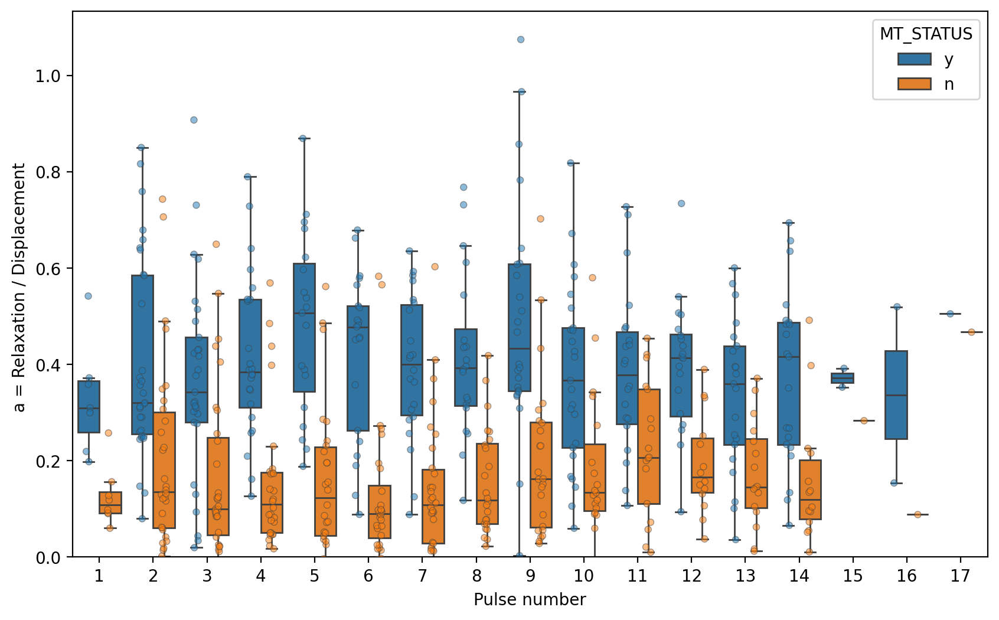

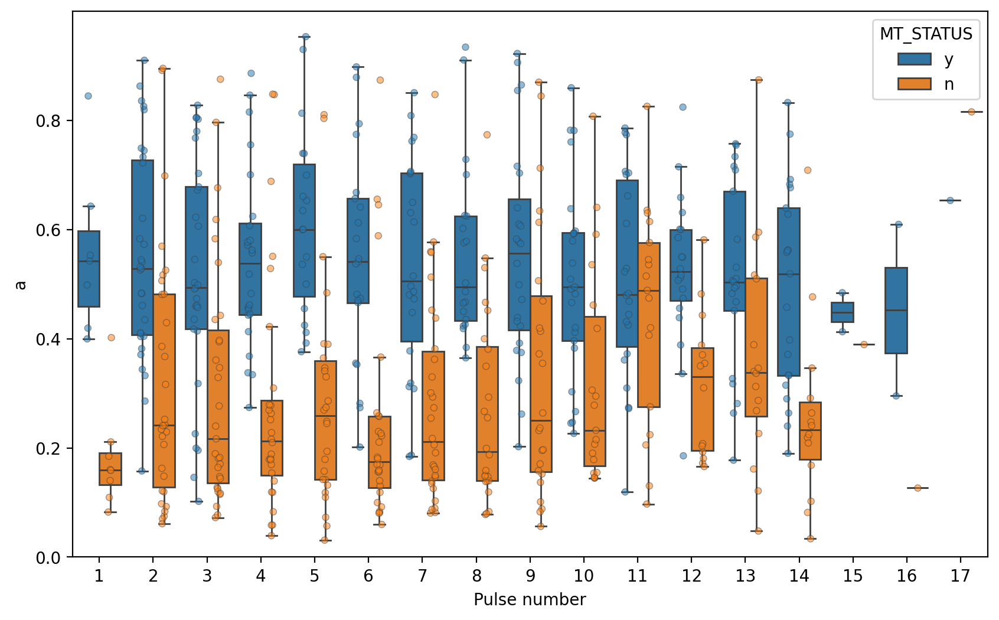

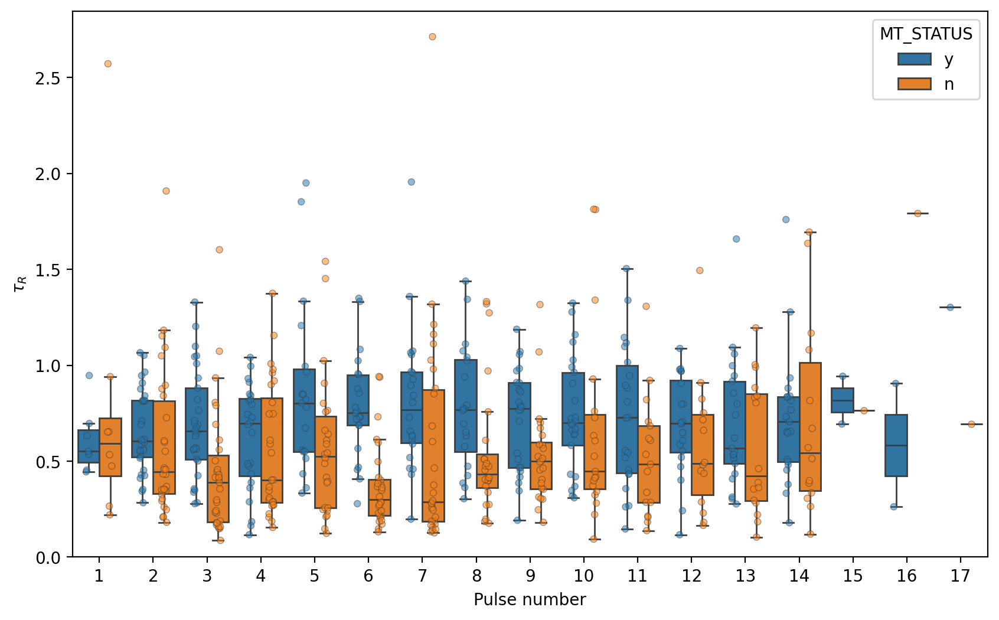

In [76]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df_results_filtered, fliersize=0)
    sns.stripplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df_results_filtered, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4)
    plt.xlabel('Pulse number')
    plt.ylabel(label)
    plt.ylim(bottom=0)

    plt.show()

# Binned by force

## Data together with rolling average

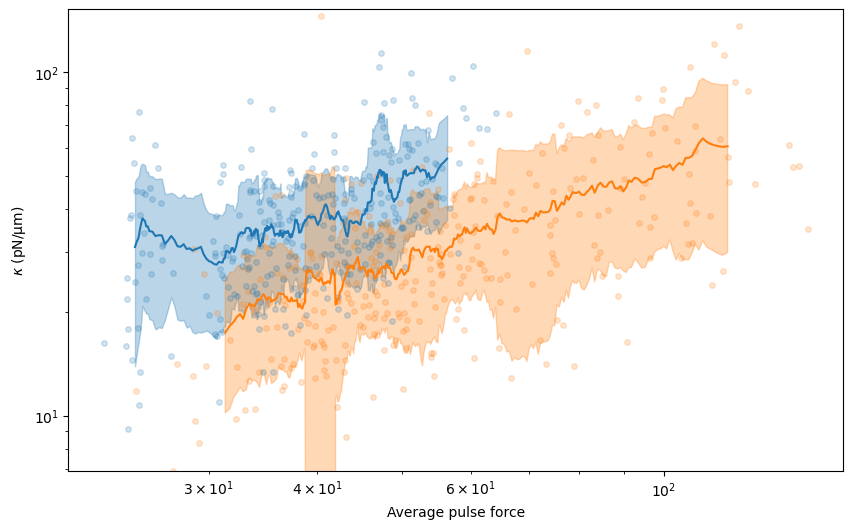

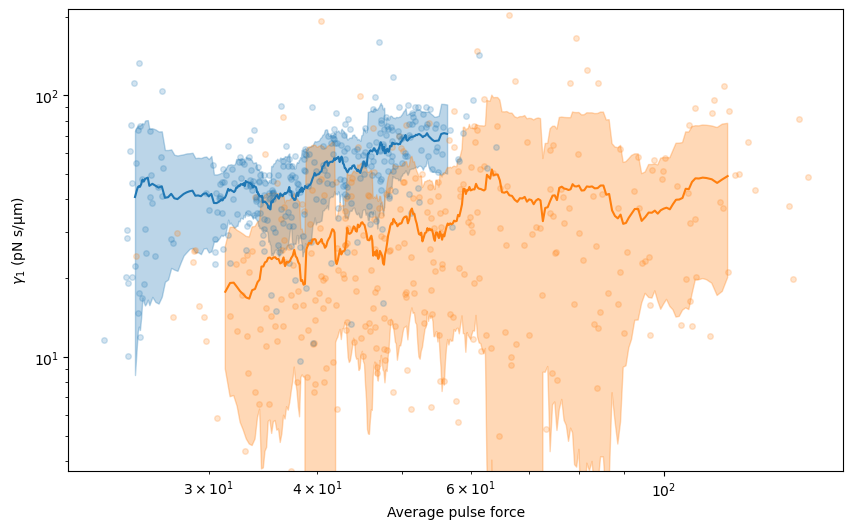

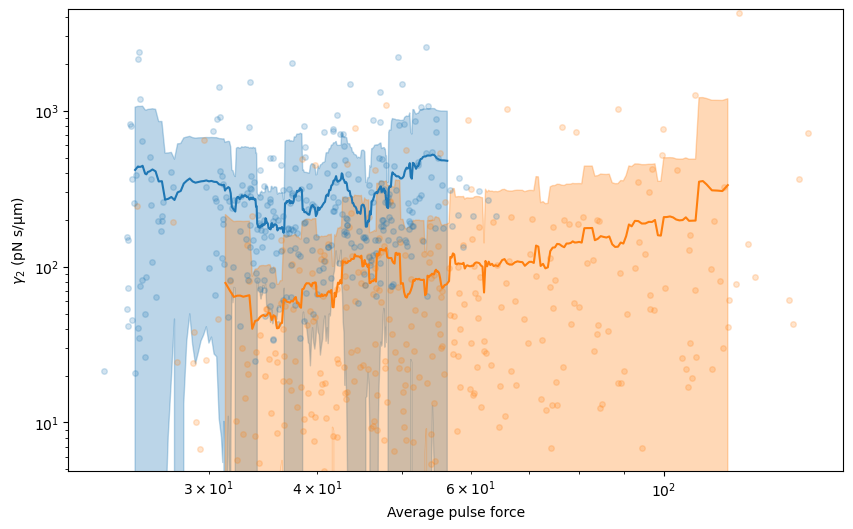

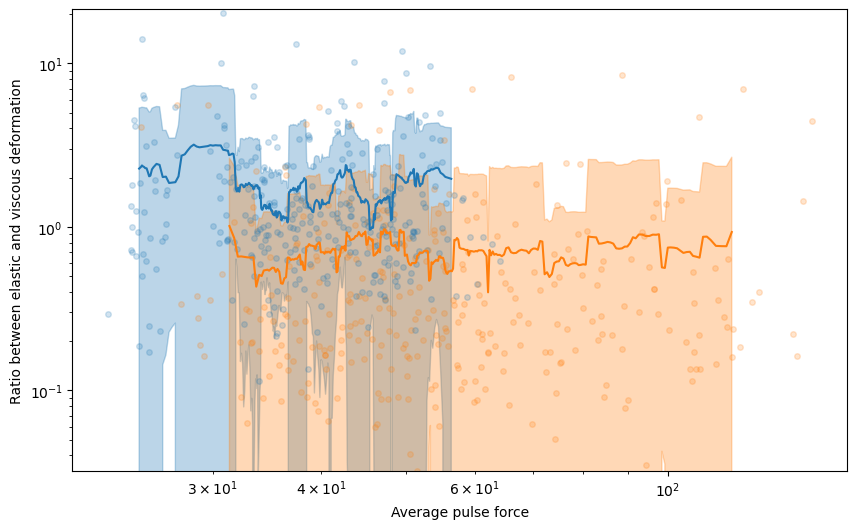

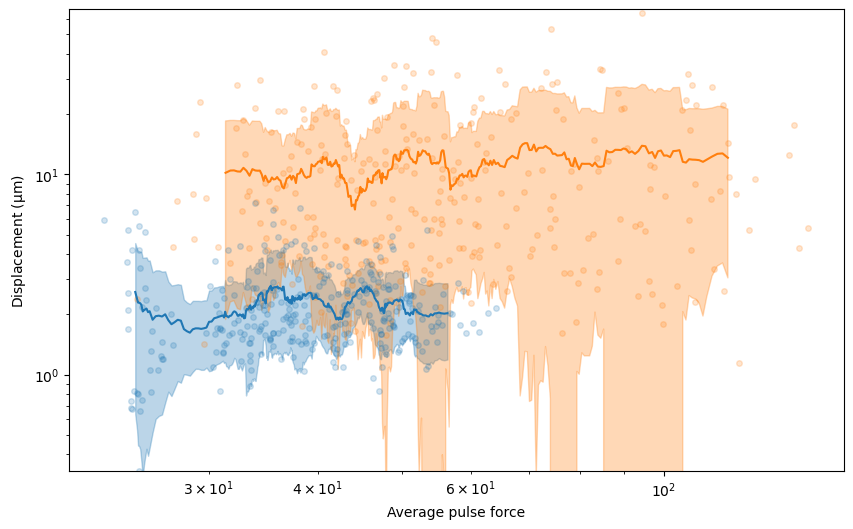

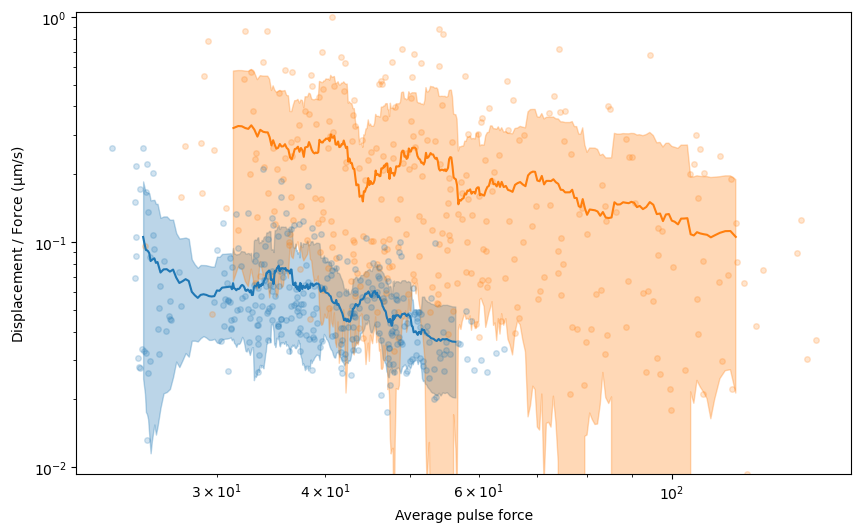

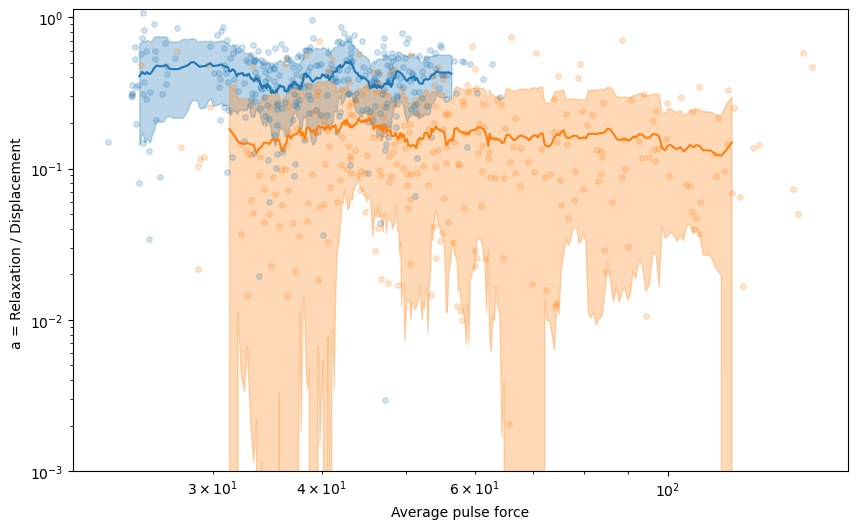

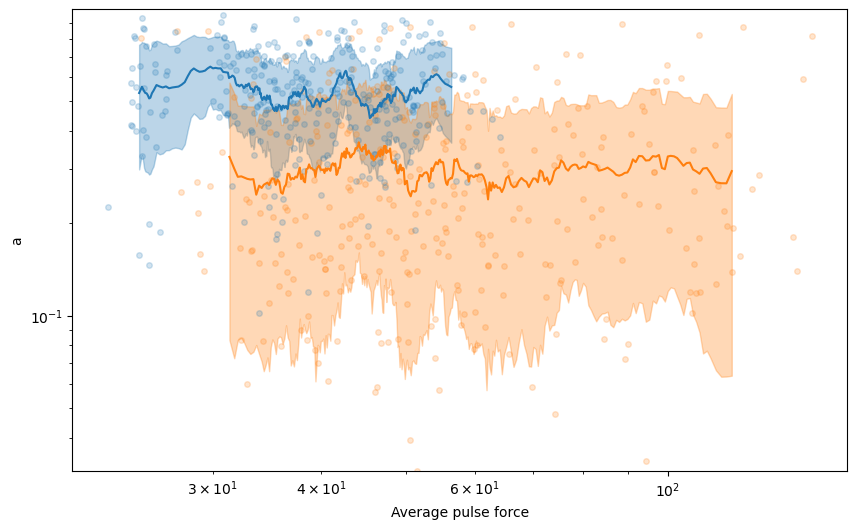

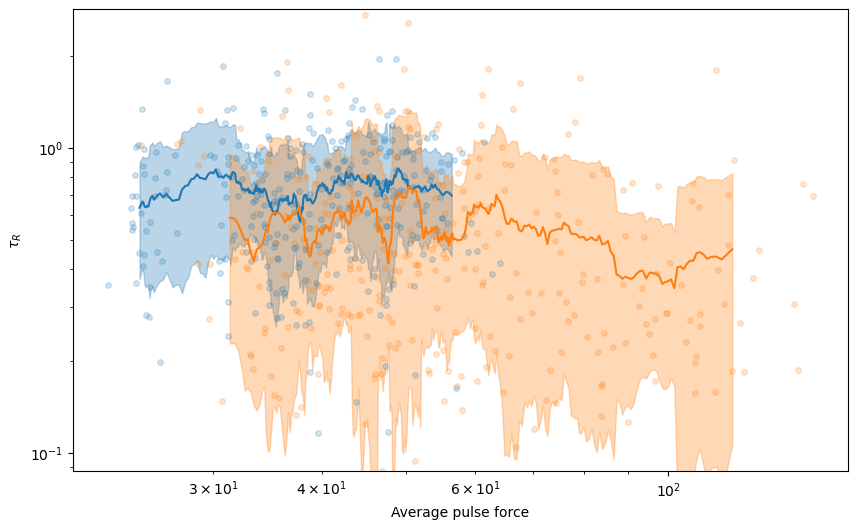

In [77]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6))
    # plot all data
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', 'AVG_FORCE'], df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', param], 'o', color=sns.color_palette()[1], alpha=0.2, markersize = 4)
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', 'AVG_FORCE'], df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', param], 'o', color=sns.color_palette()[0], alpha=0.2, markersize = 4)
    
    window = 25
    # plot the roling average
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', param].rolling(window=window, center=True).mean(), '-', color=sns.color_palette()[0], alpha=1)

    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', param].rolling(window=window , center=True).mean(), '-', color=sns.color_palette()[1], alpha=1)

    # plot the standard deviation
    plt.fill_between(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', param].rolling(window=window, center=True).mean()- df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', param].rolling(window=window, center=True).std(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', param].rolling(window=window, center=True).mean()+ df_results_filtered.loc[df_results_filtered['MT_STATUS']=='y', param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[0], alpha=0.3)

    plt.fill_between(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', param].rolling(window=window, center=True).mean()- df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', param].rolling(window=window, center=True).std(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', param].rolling(window=window, center=True).mean()+ df_results_filtered.loc[df_results_filtered['MT_STATUS']=='n', param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[1], alpha=0.3)


    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

## Bootstrapping the data

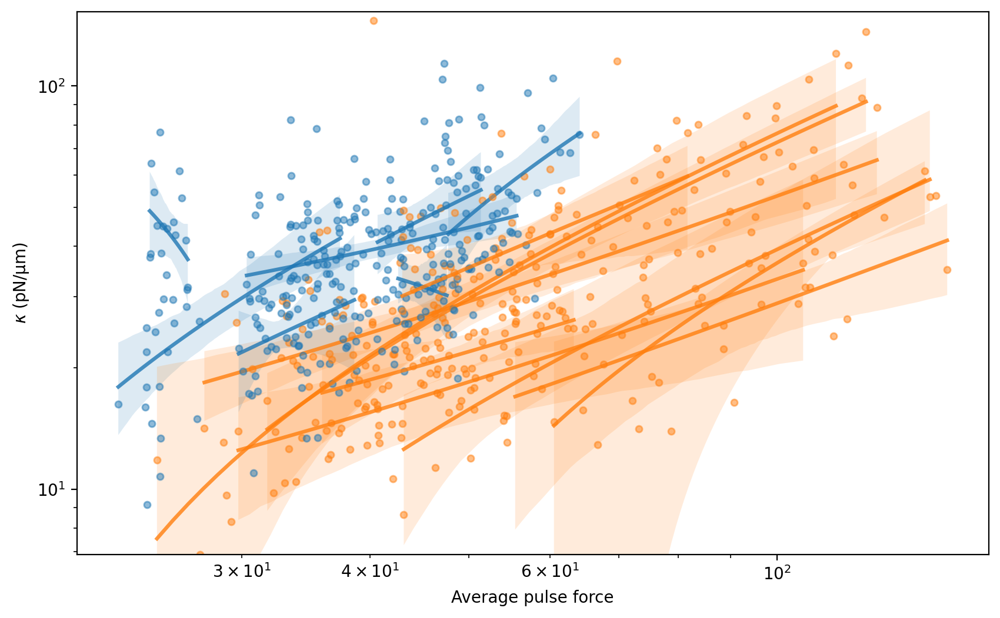

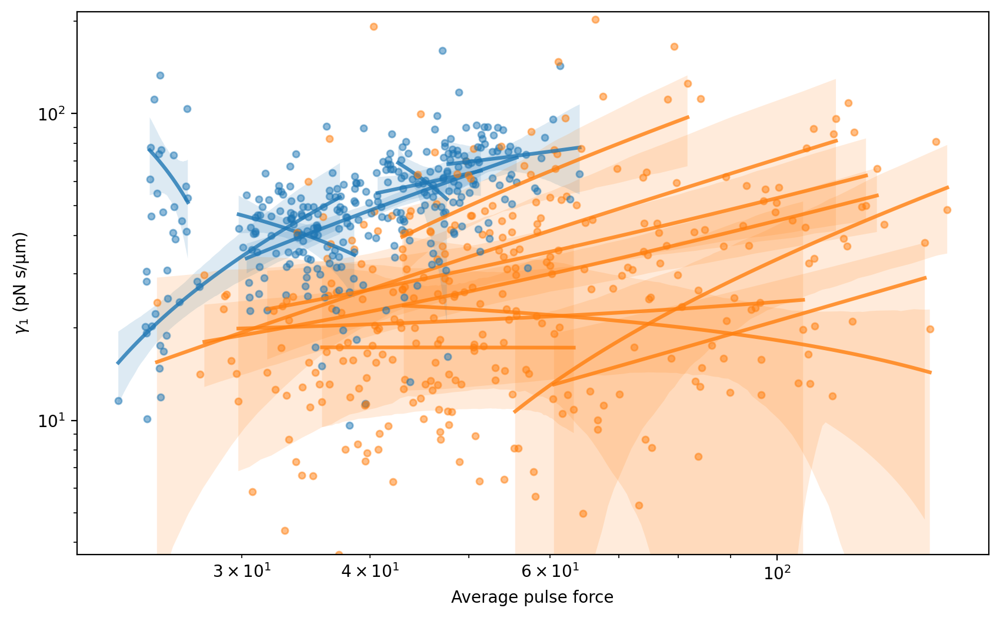

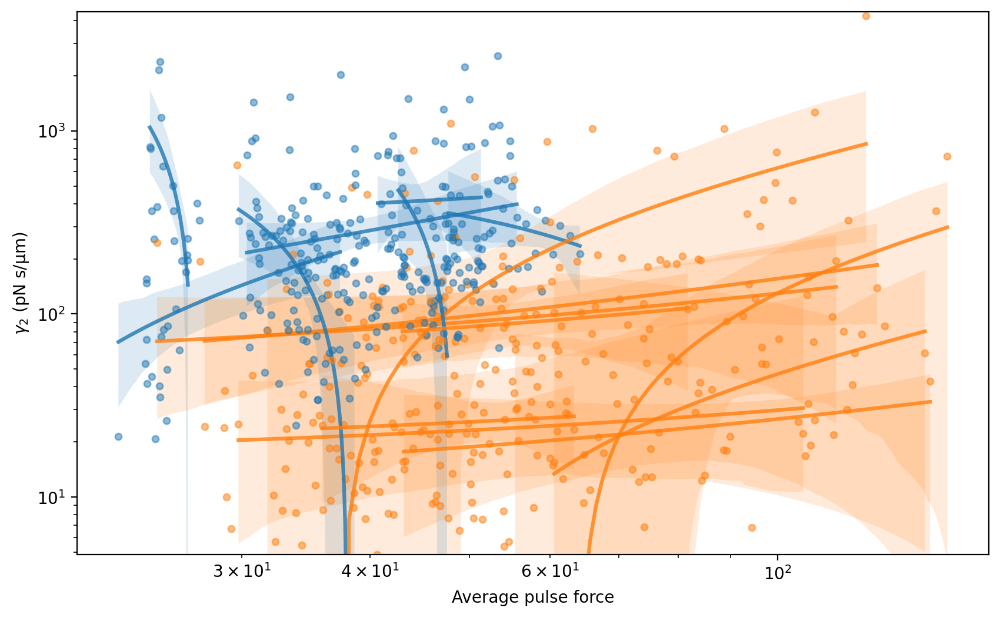

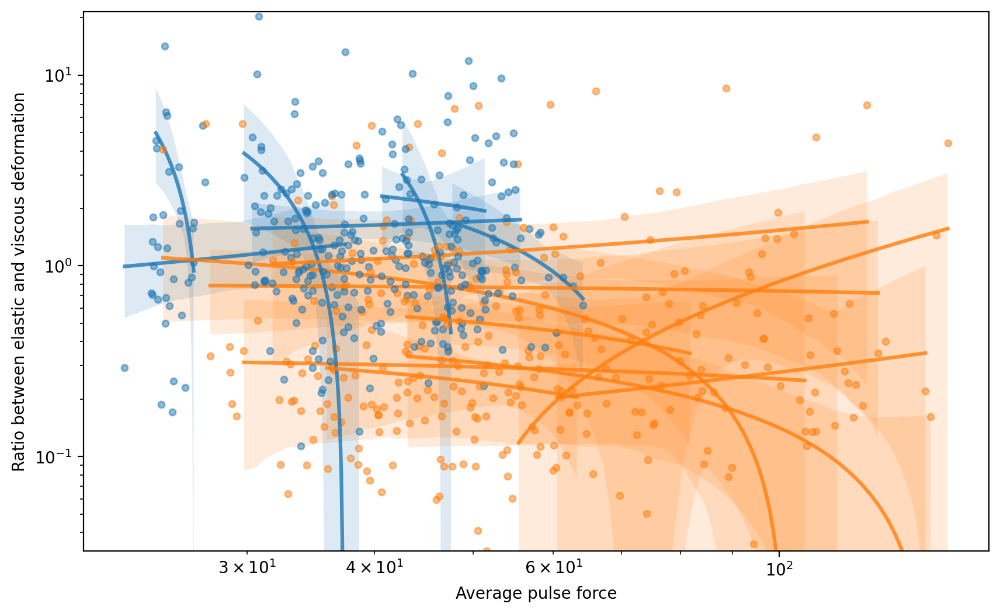

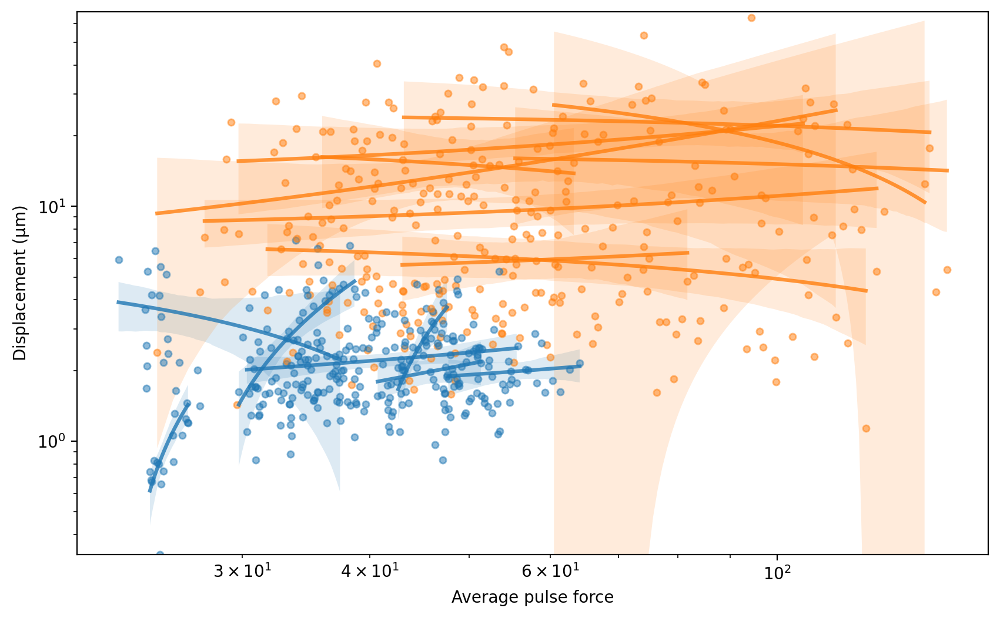

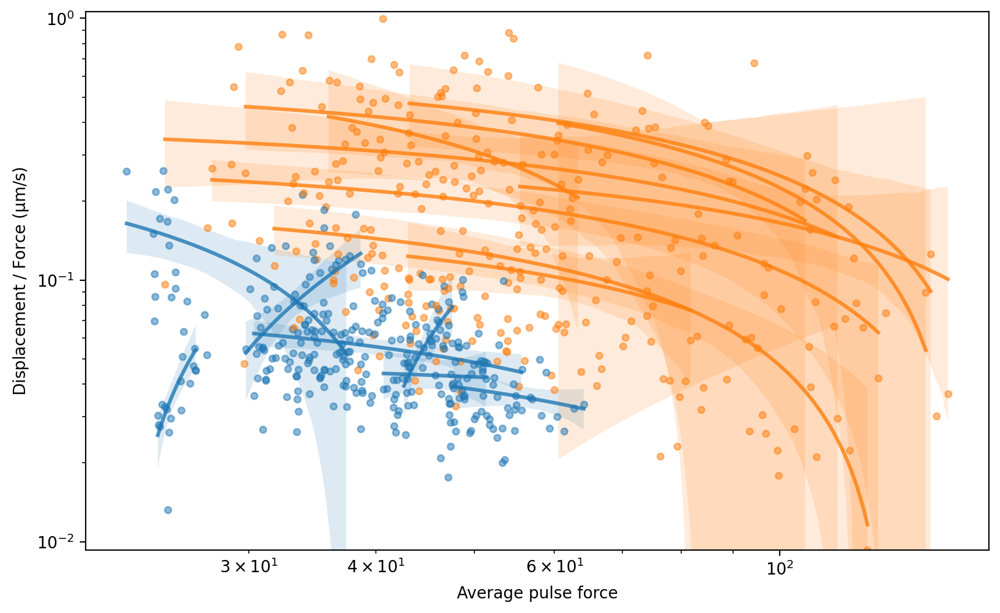

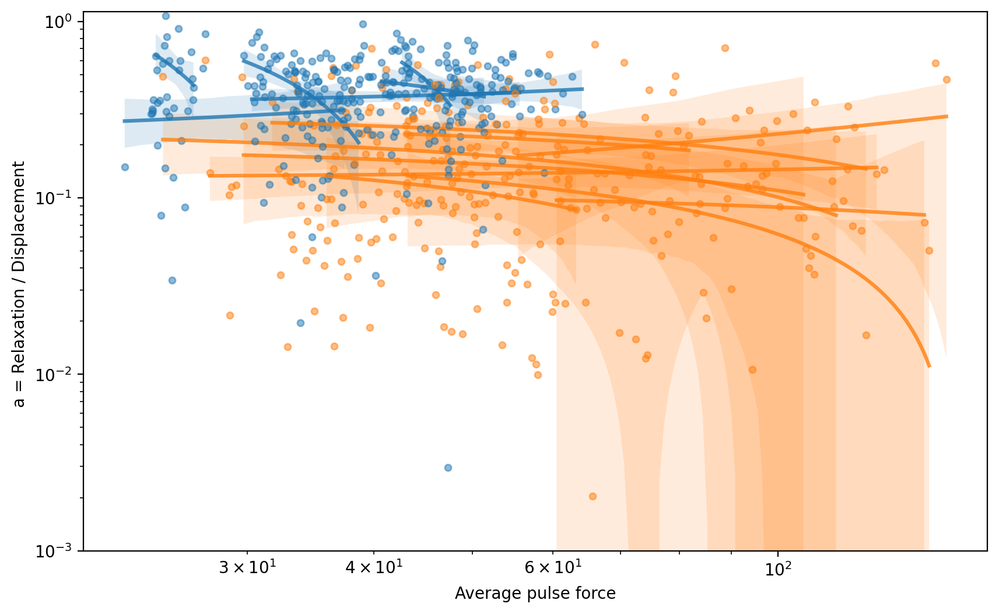

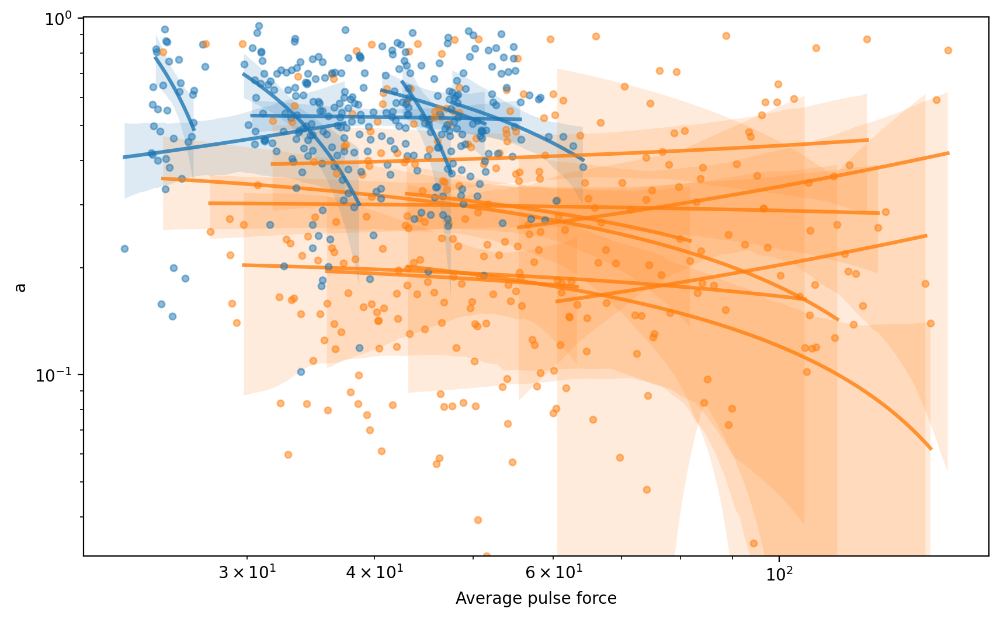

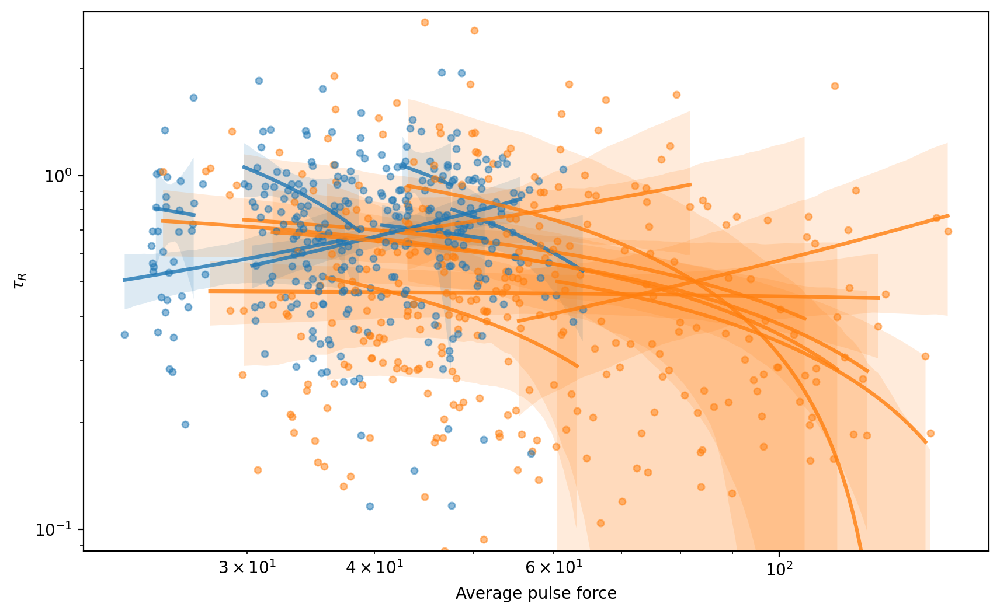

In [78]:
rng = np.random.default_rng()

df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot all data
    for (i, embryo) in enumerate(df_results_filtered['EMBRYO'].unique()):
        plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='n')&(df_results_filtered['EMBRYO']==embryo), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='n')&(df_results_filtered['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
        plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='y')&(df_results_filtered['EMBRYO']==embryo), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='y')&(df_results_filtered['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4, label=embryo)
        
        if len(df_results_filtered[(df_results_filtered['MT_STATUS']=='y')&(df_results_filtered['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='y')&(df_results_filtered['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[0], alpha=0.8))

        if len(df_results_filtered[(df_results_filtered['MT_STATUS']=='n')&(df_results_filtered['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='n')&(df_results_filtered['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))
    
    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

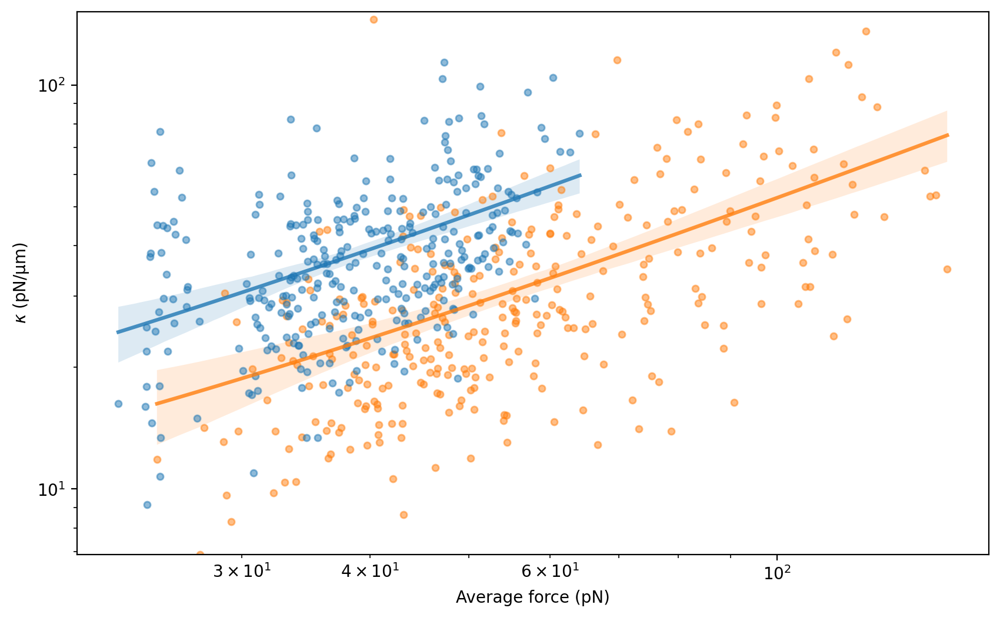

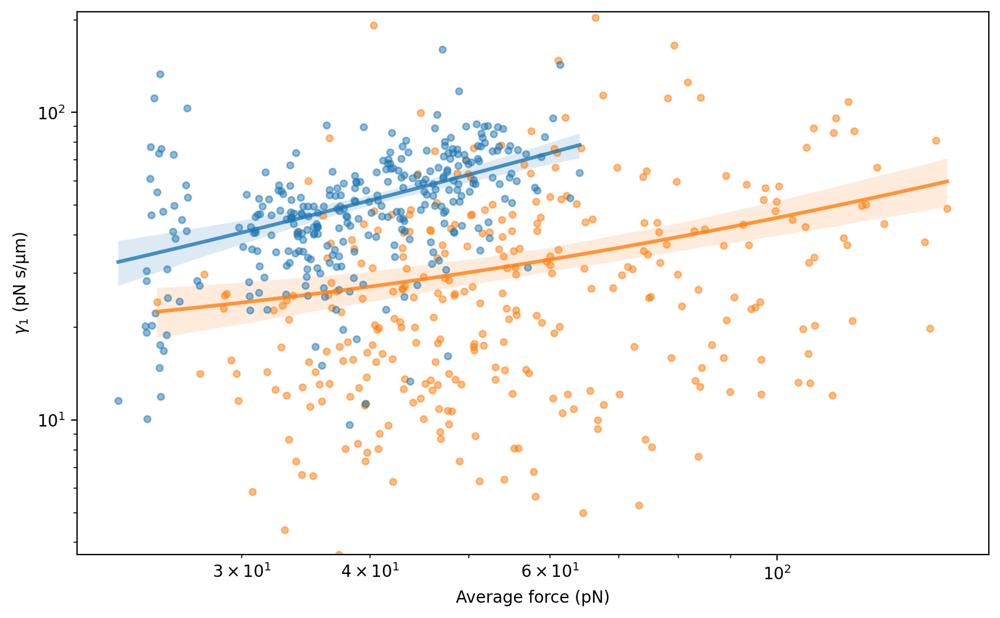

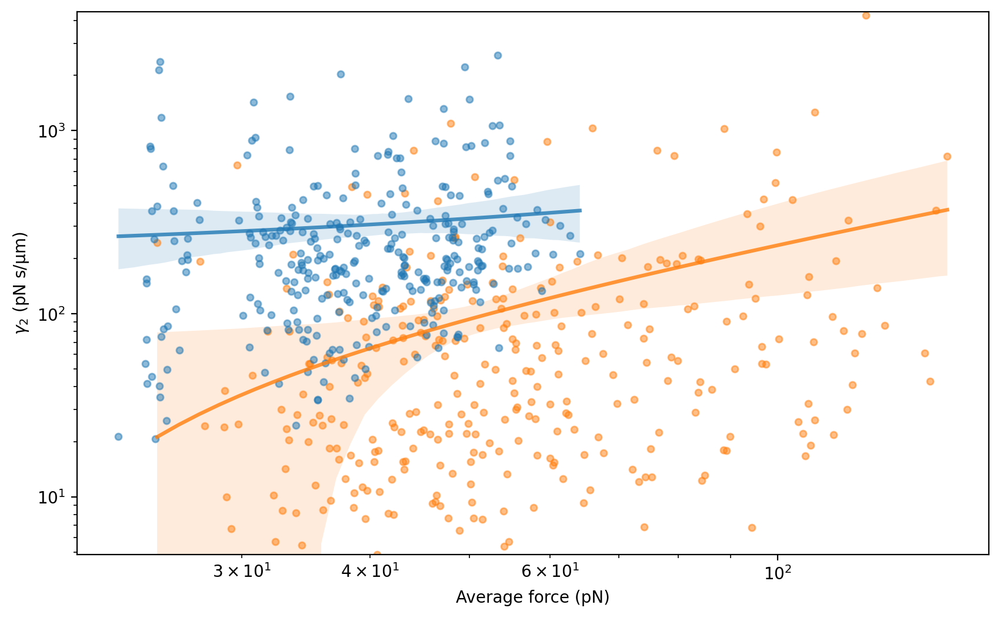

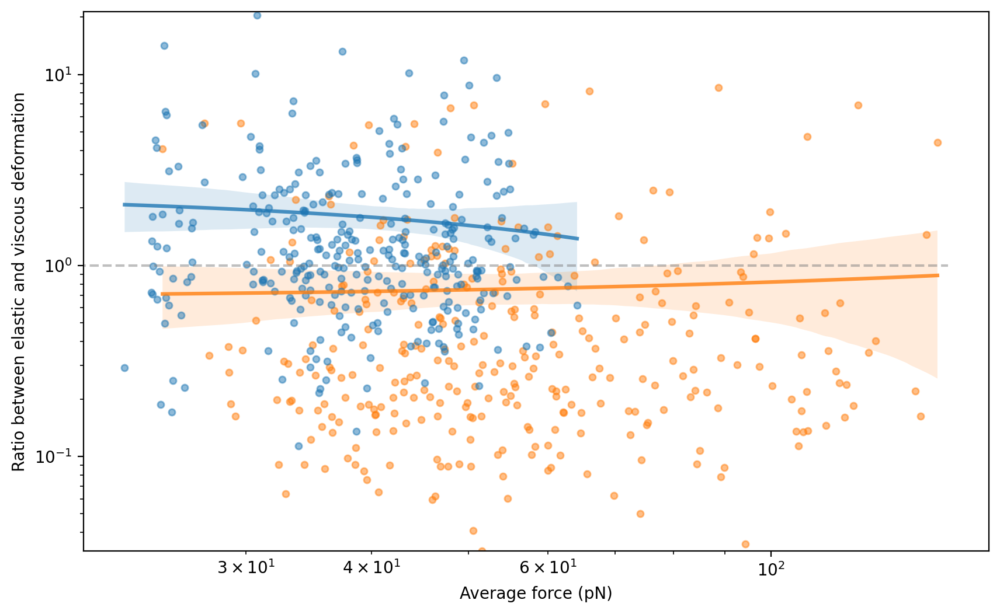

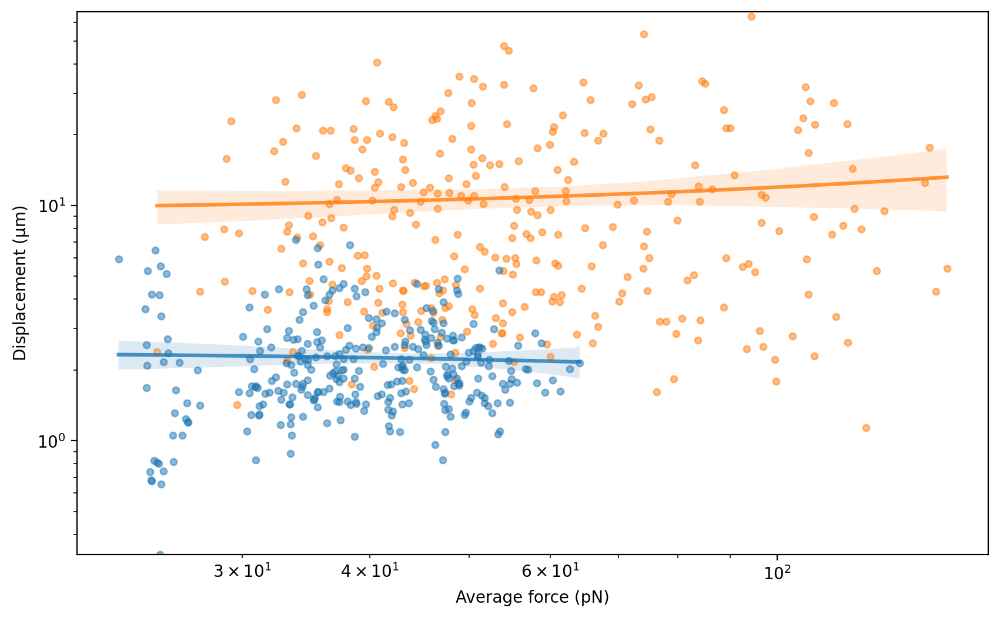

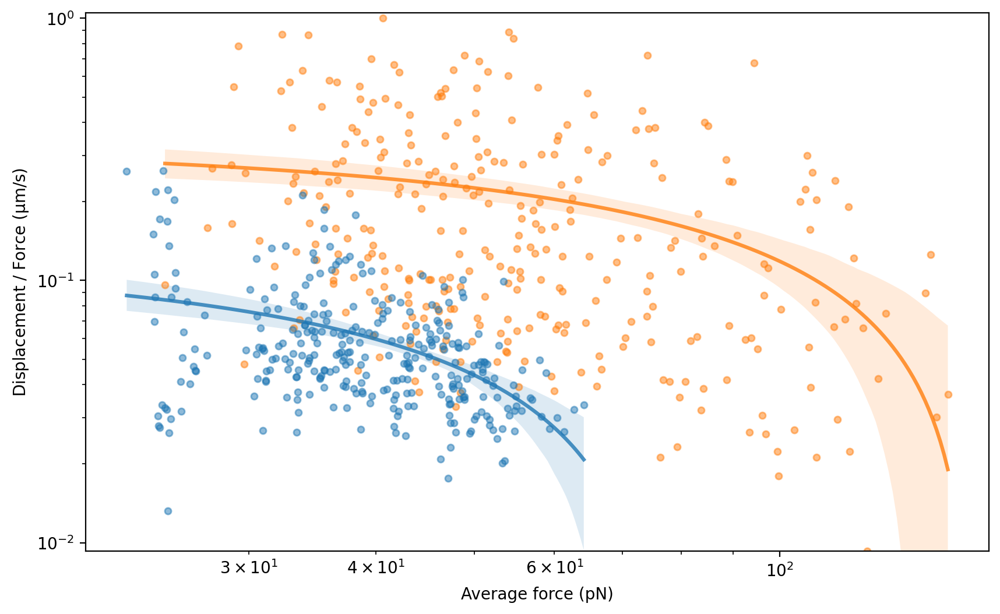

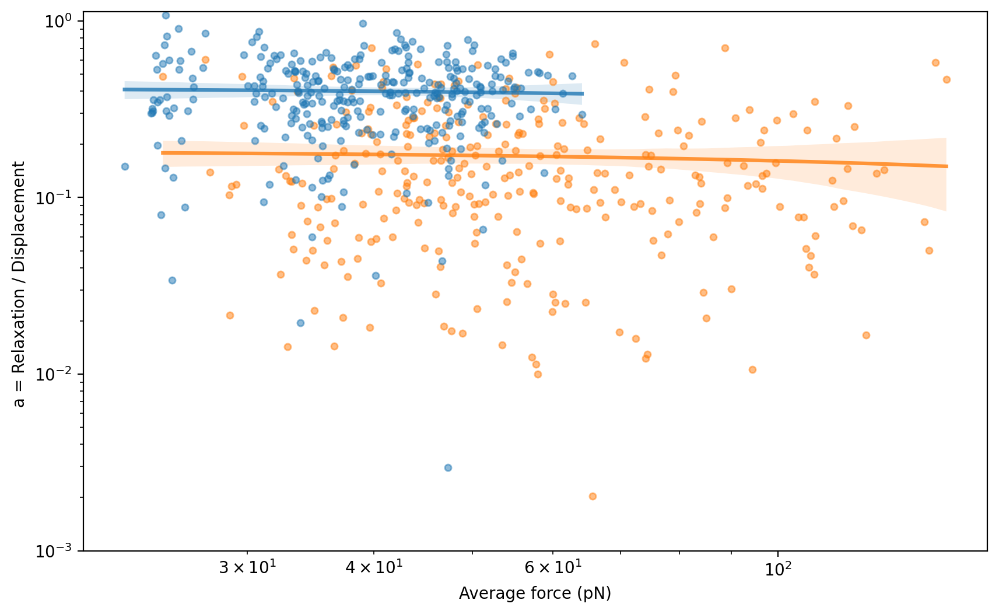

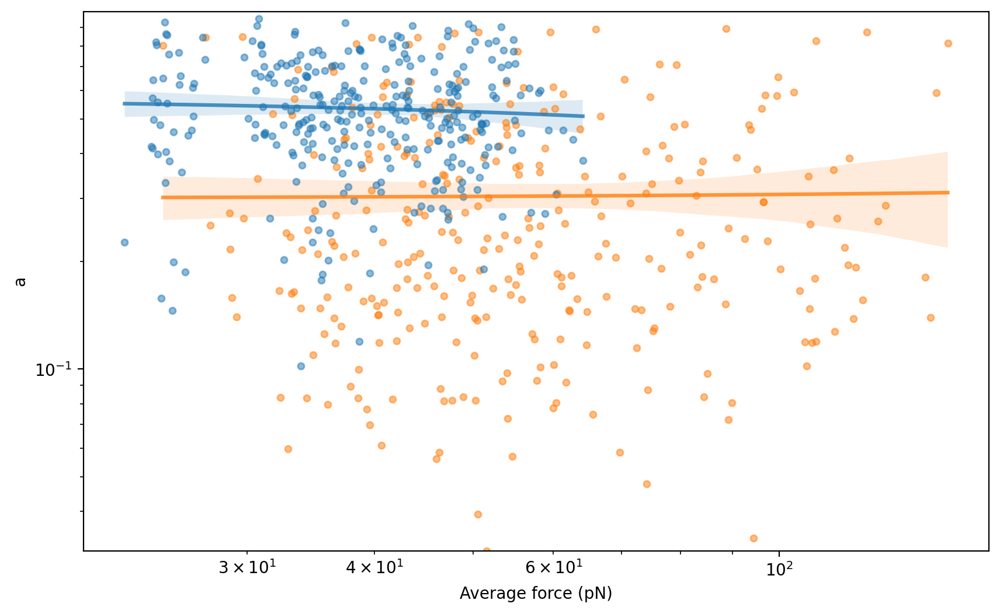

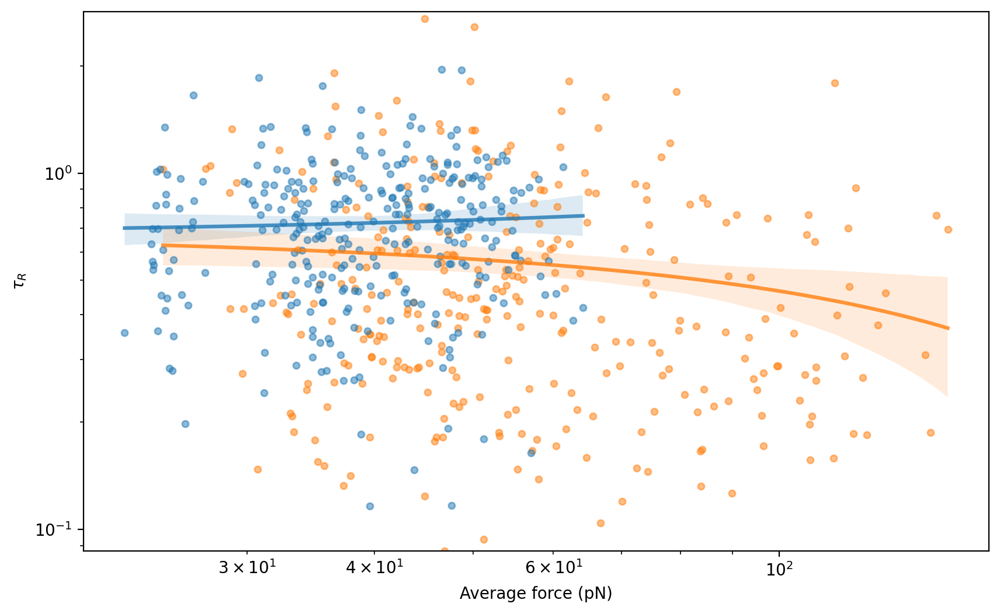

In [79]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot all data
    plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='n'), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='n'), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
    plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='y'), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='y'), param], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4, label=embryo)
    
    sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='y')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[0], alpha=0.8))

    sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='n')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))

    if param =='elastic_viscous_ratio':
        plt.hlines(1, 0, 150, color='gray', linestyle='--', alpha=0.5)
    
    plt.xlabel('Average force (pN)')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    # plt.ylim(bottom=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

# Individual curves averaged and binned by force

In [80]:
folder = '/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/2_analysis/measurements_extended_info/'

df_all_tracks = pd.DataFrame()
for file in os.listdir(folder):
    if file.endswith('.h5'):
        # Read the data using pandas
        df = pd.read_hdf(folder+file)
        df['file'] = file
        df['EXPERIMENT'] = file[:18].replace('_', '')
        df['EMBRYO'] = file[:15].replace('_', '')
        df_all_tracks = pd.concat([df_all_tracks, df])

df_all_tracks.dropna(subset=['CORRECTED DISPLACEMENT [um]'], inplace=True)

print(df_all_tracks.columns)

Index(['LABEL', 'ID', 'TRACK_ID', 'QUALITY', 'POSITION_X', 'POSITION_Y',
       'POSITION_Z', 'POSITION_T', 'FRAME', 'RADIUS', 'VISIBILITY',
       'MANUAL_SPOT_COLOR', 'MEAN_INTENSITY_CH1', 'MEDIAN_INTENSITY_CH1',
       'MIN_INTENSITY_CH1', 'MAX_INTENSITY_CH1', 'TOTAL_INTENSITY_CH1',
       'STD_INTENSITY_CH1', 'CONTRAST_CH1', 'SNR_CH1', 'DISTANCE [um]',
       'MAGNET_STATUS', 'PULSE_NUMBER', 'FORCE [pN]', 'MT_STATUS',
       'DISPLACEMENT [um]', 'CORRECTION_k', 'CORRECTION_k_ERR', 'CORRECTION_N',
       'CORRECTION_N_ERR', 'CORRECTED DISPLACEMENT [um]', 'file', 'EXPERIMENT',
       'EMBRYO'],
      dtype='object')


In [81]:
df_all_tracks['USABLE'] = np.zeros(len(df_all_tracks))
for measurement in df_results_filtered[['EXPERIMENT', 'TRACK_ID', 'PULSE_NUMBER']].values:
    embryo, track, pulse = measurement
    
    df = df_all_tracks.loc[(df_all_tracks['EXPERIMENT']==embryo)&(df_all_tracks['TRACK_ID']==track)&(df_all_tracks['PULSE_NUMBER']==pulse)]

    df_all_tracks.loc[(df_all_tracks['EXPERIMENT']==embryo)&(df_all_tracks['TRACK_ID']==track)&(df_all_tracks['PULSE_NUMBER']==pulse), 'NORMALIZED_TIME'] = (df['POSITION_T']-np.min(df['POSITION_T'])) * dt
    
    df_all_tracks.loc[(df_all_tracks['EXPERIMENT']==embryo)&(df_all_tracks['TRACK_ID']==track)&(df_all_tracks['PULSE_NUMBER']==pulse), 'AVG_FORCE'] = df_results_filtered.loc[(df_results_filtered['EXPERIMENT']==embryo)&(df_results_filtered['TRACK_ID']==track)&(df_results_filtered['PULSE_NUMBER']==pulse), 'AVG_FORCE'].values[0]

    df_all_tracks.loc[(df_all_tracks['EXPERIMENT']==embryo)&(df_all_tracks['TRACK_ID']==track)&(df_all_tracks['PULSE_NUMBER']==pulse), 'USABLE'] = 1

    if len(df['POSITION_T'])>50:
        plt.plot(df['POSITION_T']-np.min(df['POSITION_T']), df['CORRECTED DISPLACEMENT [um]'], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4)
        plt.show()
        print(embryo, track, pulse) 

print(len(df_all_tracks[df_all_tracks['USABLE'] == 1])/len(df_all_tracks))

0.8079693685508469


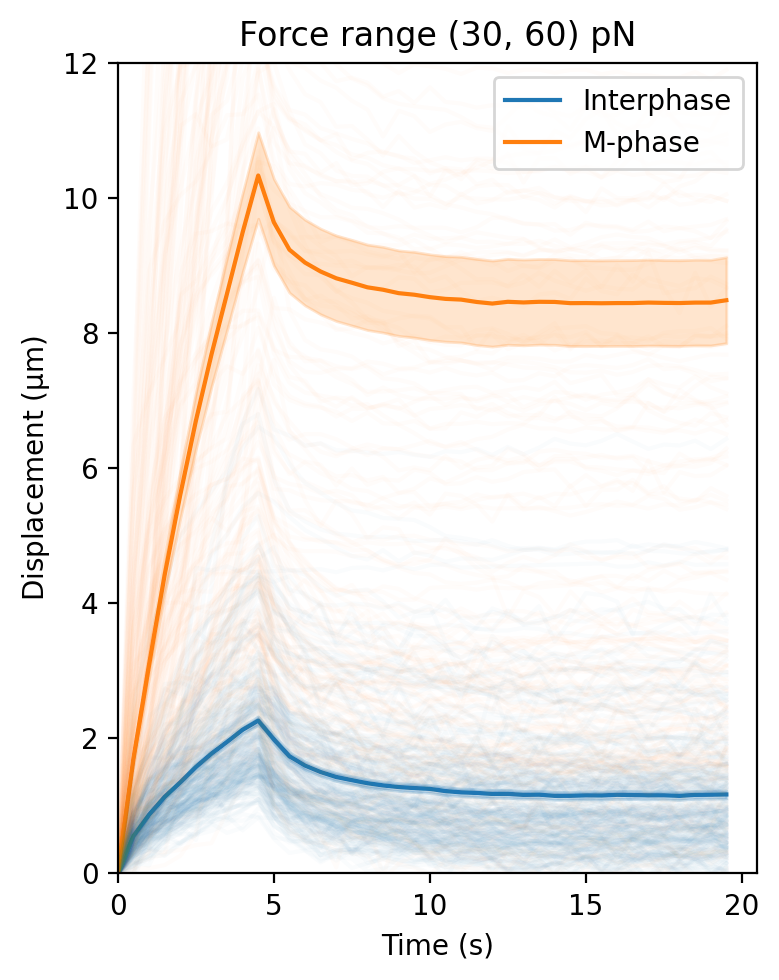

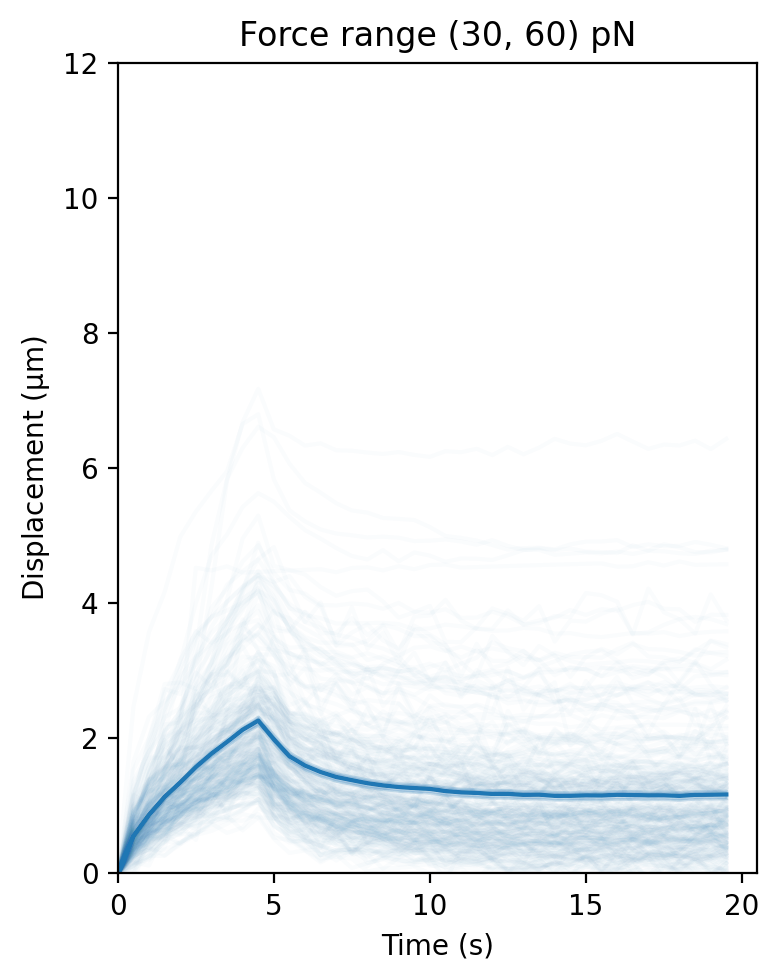

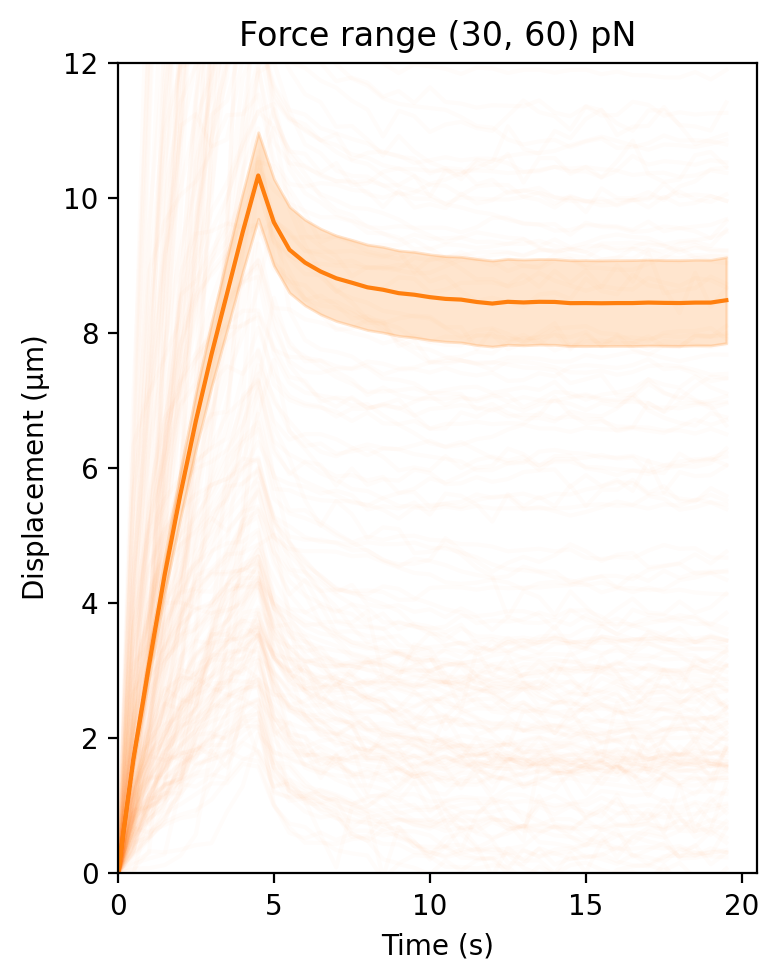

In [82]:
force_ranges = [(30,60)]

df_all_tracks = df_all_tracks.sort_values(by=['TRACK_ID', 'NORMALIZED_TIME'], ascending=True)

for force_range in force_ranges:
    df_force_range = df_all_tracks[(df_all_tracks['AVG_FORCE']>=force_range[0])&(df_all_tracks['AVG_FORCE']<force_range[1])&(df_all_tracks['USABLE']==1)]

    plt.figure(figsize=(4, 5), dpi=200)
    # group data by MT status
    df_grouped_mean = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).mean(numeric_only=True).reset_index()
    df_grouped_mean.to_csv(f'{dir_plots}/results/results_displacement_curve_averaged_force_range{force_range[0]}-{force_range[1]}pN.csv', index=False)
    
    plt.plot(df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'NORMALIZED_TIME'], df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'], color=sns.color_palette()[0], label= 'Interphase')
    plt.plot(df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'NORMALIZED_TIME'], df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'], color=sns.color_palette()[1], label='M-phase')

    df_grouped_std = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).sem(numeric_only=True).reset_index()
    plt.fill_between(
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'NORMALIZED_TIME'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'] - df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'] + df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'],
        color=sns.color_palette()[0], alpha=0.2)
    
    plt.fill_between(
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'NORMALIZED_TIME'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'] - df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'] + df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'],
        color=sns.color_palette()[1], alpha=0.2)
    

    for exp in df_force_range['EXPERIMENT'].unique():
        for track in df_force_range[df_force_range['EXPERIMENT']==exp]['TRACK_ID'].unique():
            for pulse in df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)]['PULSE_NUMBER'].unique():
                df = df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)&(df_force_range['PULSE_NUMBER']==pulse)]
                df = df.sort_values(by='NORMALIZED_TIME', ascending=True)
                if df['MT_STATUS'].unique() == 'y':
                    plt.plot(df['NORMALIZED_TIME'], df['CORRECTED DISPLACEMENT [um]'], '-', color=sns.color_palette()[0], alpha=0.02)
                elif df['MT_STATUS'].unique() == 'n':
                    plt.plot(df['NORMALIZED_TIME'], df['CORRECTED DISPLACEMENT [um]'], '-', color=sns.color_palette()[1], alpha=0.02)
    plt.xlabel('Time (s)')
    plt.ylabel('Displacement ($\\mathrm{\\mu}$m)')
    plt.title(f'Force range {force_range} pN')
    plt.legend()
    plt.ylim(bottom=0, top=12)
    plt.xlim(left=0)
    # plt.yscale('log')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_displacement_curve_averaged.svg', format='svg')
    plt.show()

    for force_range in force_ranges:
        df_force_range = df_all_tracks[(df_all_tracks['AVG_FORCE']>=force_range[0])&(df_all_tracks['AVG_FORCE']<force_range[1])&(df_all_tracks['USABLE']==1)]

        plt.figure(figsize=(4, 5), dpi=200)
        # group data by MT status
        df_grouped_mean = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).mean(numeric_only=True).reset_index()
        df_grouped_mean.to_csv(f'{dir_plots}/results/results_displacement_curve_averaged_force_range{force_range[0]}-{force_range[1]}pN.csv', index=False)
        
        plt.plot(df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'NORMALIZED_TIME'], df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'], color=sns.color_palette()[0], label= 'Interphase')

        df_grouped_std = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).sem(numeric_only=True).reset_index()
        plt.fill_between(
            df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'NORMALIZED_TIME'], 
            df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'] - df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'], 
            df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'] + df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='y', 'CORRECTED DISPLACEMENT [um]'],
            color=sns.color_palette()[0], alpha=0.2)

        

        for exp in df_force_range['EXPERIMENT'].unique():
            for track in df_force_range[df_force_range['EXPERIMENT']==exp]['TRACK_ID'].unique():
                for pulse in df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)]['PULSE_NUMBER'].unique():
                    df = df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)&(df_force_range['PULSE_NUMBER']==pulse)]
                    df = df.sort_values(by='NORMALIZED_TIME', ascending=True)
                    if df['MT_STATUS'].unique() == 'y':
                        plt.plot(df['NORMALIZED_TIME'], df['CORRECTED DISPLACEMENT [um]'], '-', color=sns.color_palette()[0], alpha=0.02)
        plt.xlabel('Time (s)')
        plt.ylabel('Displacement ($\\mathrm{\\mu}$m)')
        plt.title(f'Force range {force_range} pN')
        # plt.legend()
        plt.ylim(bottom=0, top=12)
        plt.xlim(left=0)
        # plt.yscale('log')
        plt.tight_layout()
        plt.savefig(f'{dir_plots}/results/result_displacement_curve_averaged_interphase.svg', format='svg')
        plt.show()

for force_range in force_ranges:
    df_force_range = df_all_tracks[(df_all_tracks['AVG_FORCE']>=force_range[0])&(df_all_tracks['AVG_FORCE']<force_range[1])&(df_all_tracks['USABLE']==1)]

    plt.figure(figsize=(4, 5), dpi=200)
    # group data by MT status
    df_grouped_mean = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).mean(numeric_only=True).reset_index()
    df_grouped_mean.to_csv(f'{dir_plots}/results/results_displacement_curve_averaged_force_range{force_range[0]}-{force_range[1]}pN.csv', index=False)
    
    plt.plot(df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'NORMALIZED_TIME'], df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'], color=sns.color_palette()[1], label='M-phase')

    df_grouped_std = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).sem(numeric_only=True).reset_index()
    
    plt.fill_between(
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'NORMALIZED_TIME'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'] - df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'] + df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='n', 'CORRECTED DISPLACEMENT [um]'],
        color=sns.color_palette()[1], alpha=0.2)
    

    for exp in df_force_range['EXPERIMENT'].unique():
        for track in df_force_range[df_force_range['EXPERIMENT']==exp]['TRACK_ID'].unique():
            for pulse in df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)]['PULSE_NUMBER'].unique():
                df = df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)&(df_force_range['PULSE_NUMBER']==pulse)]
                df = df.sort_values(by='NORMALIZED_TIME', ascending=True)
                if df['MT_STATUS'].unique() == 'n':
                    plt.plot(df['NORMALIZED_TIME'], df['CORRECTED DISPLACEMENT [um]'], '-', color=sns.color_palette()[1], alpha=0.02)
    plt.xlabel('Time (s)')
    plt.ylabel('Displacement ($\\mathrm{\\mu}$m)')
    plt.title(f'Force range {force_range} pN')
    # plt.legend()
    plt.ylim(bottom=0, top=12)
    plt.xlim(left=0)
    # plt.yscale('log')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_displacement_curve_averaged_m-phase.svg', format='svg')
    plt.show()

# Averaged data without background flow subtraction

MultiIndex([(        'MT_STATUS',     ''),
            (  'NORMALIZED_TIME',     ''),
            ('DISPLACEMENT [um]', 'mean'),
            ('DISPLACEMENT [um]',  'std'),
            ('DISPLACEMENT [um]',  'sem'),
            (       'FORCE [pN]', 'mean'),
            (       'FORCE [pN]',  'std'),
            (       'FORCE [pN]',  'sem')],
           )


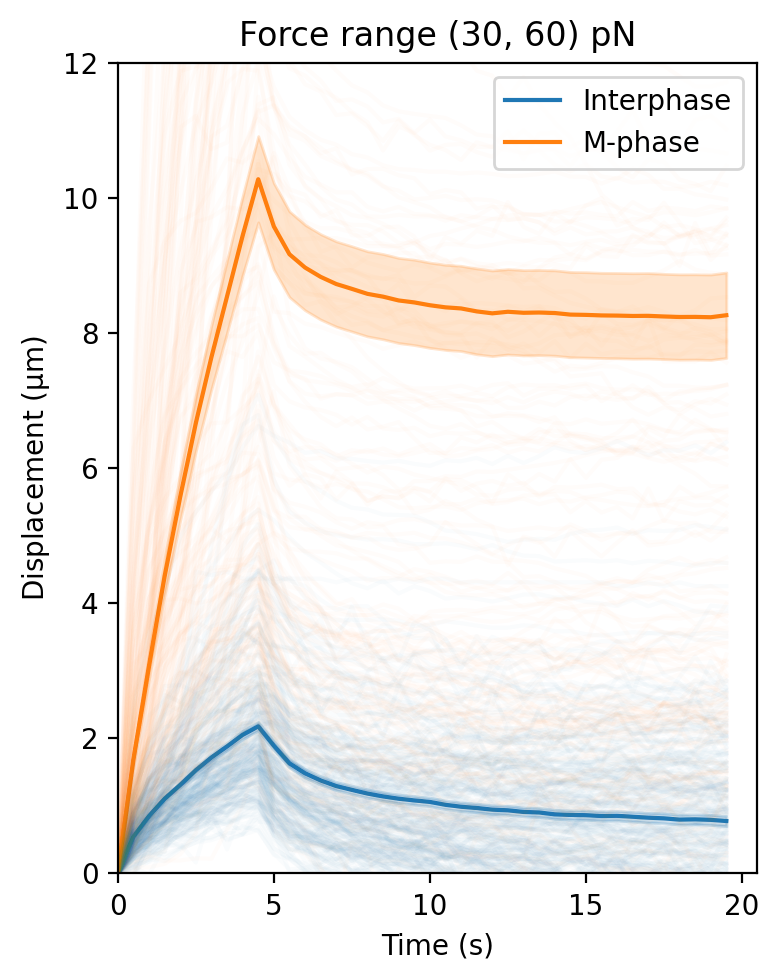

In [83]:
# use the original displacement, not corrected

force_ranges = [(30,60)]

df_all_tracks = df_all_tracks.sort_values(by=['TRACK_ID', 'NORMALIZED_TIME'], ascending=True)

for force_range in force_ranges:
    df_force_range = df_all_tracks[(df_all_tracks['AVG_FORCE']>=force_range[0])&(df_all_tracks['AVG_FORCE']<force_range[1])&(df_all_tracks['USABLE']==1)]

    plt.figure(figsize=(4, 5), dpi=200)
    # group data by MT status
    df_grouped_mean = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).mean(numeric_only=True).reset_index()
    df_grouped_mean_std = df_force_range.groupby(['MT_STATUS', 'NORMALIZED_TIME'])[['DISPLACEMENT [um]', 'FORCE [pN]']].agg(['mean', 'std', 'sem']).reset_index()
    print(df_grouped_mean_std.columns)
    df_grouped_mean_std.to_csv(f'{dir_plots}/results/results_displacement_curve_averaged_force_range{force_range[0]}-{force_range[1]}pN_no-bckg-correction.csv', index=False)
    
    plt.plot(df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'NORMALIZED_TIME'], df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'DISPLACEMENT [um]'], color=sns.color_palette()[0], label= 'Interphase')
    plt.plot(df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'NORMALIZED_TIME'], df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'DISPLACEMENT [um]'], color=sns.color_palette()[1], label='M-phase')

    df_grouped_std = df_force_range.groupby(by=['MT_STATUS', 'NORMALIZED_TIME']).sem(numeric_only=True).reset_index()
    plt.fill_between(
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'NORMALIZED_TIME'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'DISPLACEMENT [um]'] - df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='y', 'DISPLACEMENT [um]'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='y', 'DISPLACEMENT [um]'] + df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='y', 'DISPLACEMENT [um]'],
        color=sns.color_palette()[0], alpha=0.2)
    
    plt.fill_between(
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'NORMALIZED_TIME'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'DISPLACEMENT [um]'] - df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='n', 'DISPLACEMENT [um]'], 
        df_grouped_mean.loc[df_grouped_mean['MT_STATUS']=='n', 'DISPLACEMENT [um]'] + df_grouped_std.loc[df_grouped_mean['MT_STATUS']=='n', 'DISPLACEMENT [um]'],
        color=sns.color_palette()[1], alpha=0.2)
    

    for exp in df_force_range['EXPERIMENT'].unique():
        for track in df_force_range[df_force_range['EXPERIMENT']==exp]['TRACK_ID'].unique():
            for pulse in df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)]['PULSE_NUMBER'].unique():
                df = df_force_range[(df_force_range['EXPERIMENT']==exp)&(df_force_range['TRACK_ID']==track)&(df_force_range['PULSE_NUMBER']==pulse)]
                df = df.sort_values(by='NORMALIZED_TIME', ascending=True)
                if df['MT_STATUS'].unique() == 'y':
                    plt.plot(df['NORMALIZED_TIME'], df['DISPLACEMENT [um]'], '-', color=sns.color_palette()[0], alpha=0.02)
                elif df['MT_STATUS'].unique() == 'n':
                    plt.plot(df['NORMALIZED_TIME'], df['DISPLACEMENT [um]'], '-', color=sns.color_palette()[1], alpha=0.02)
    plt.xlabel('Time (s)')
    plt.ylabel('Displacement ($\\mathrm{\\mu}$m)')
    plt.title(f'Force range {force_range} pN')
    plt.legend()
    plt.ylim(bottom=0, top=12)
    plt.xlim(left=0)
    # plt.yscale('log')
    # plt.xscale('log')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_displacement_averaged_no-bckg-correction_curve.svg', format='svg')
    plt.show()

# Histograms of binned force data

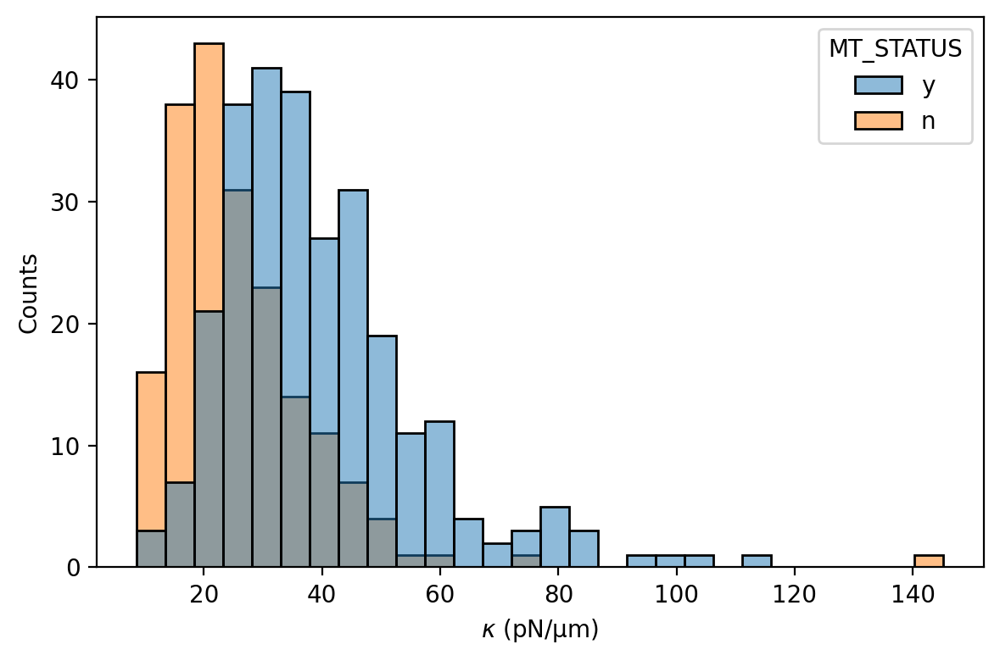

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


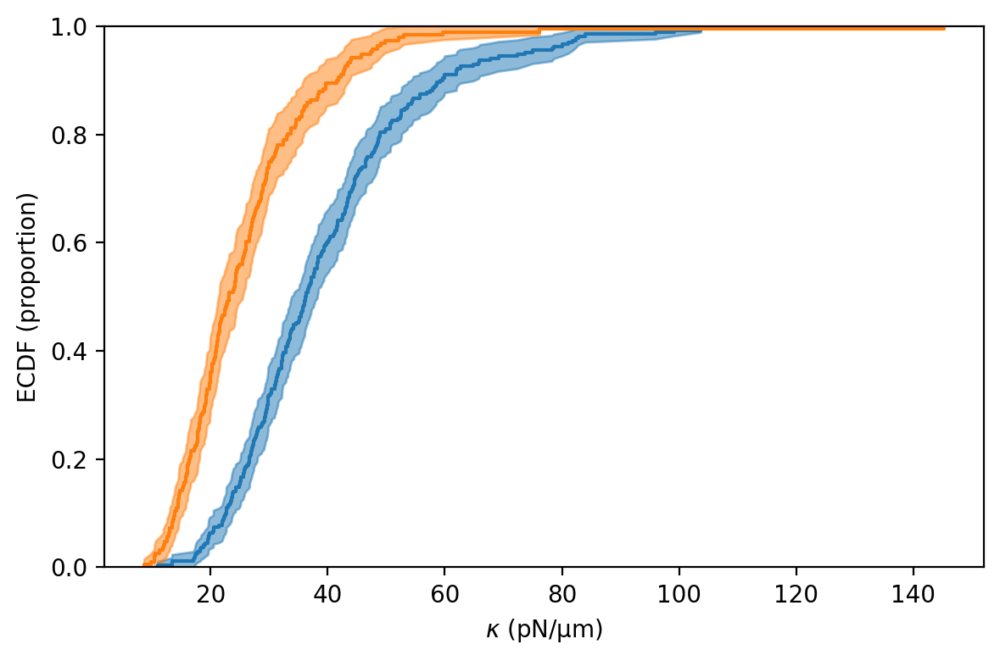

MannwhitneyuResult(statistic=np.float64(11229.0), pvalue=np.float64(5.158774004326567e-25))


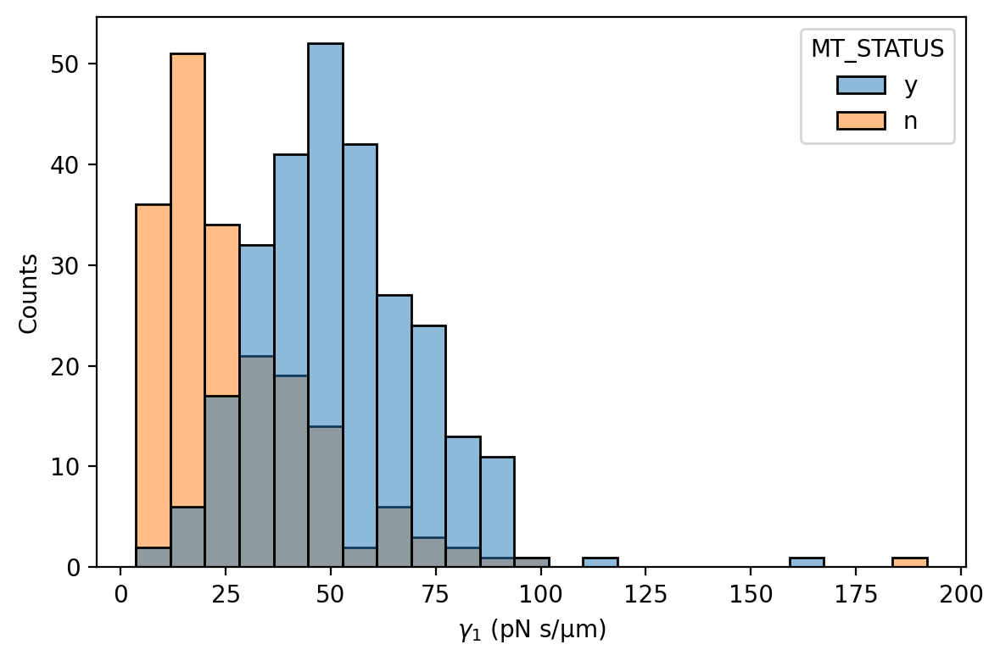

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


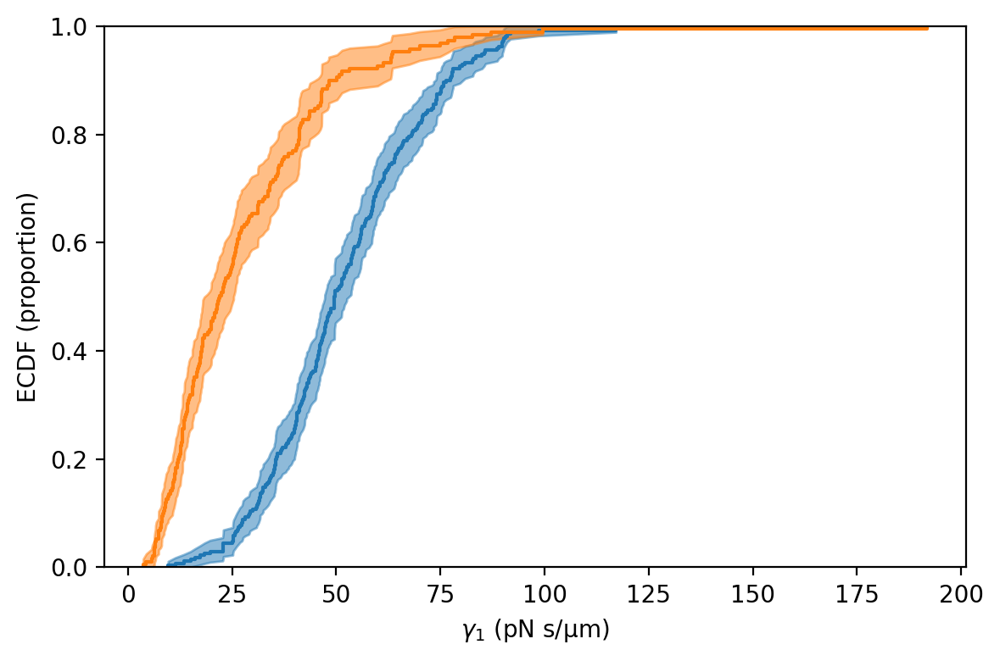

MannwhitneyuResult(statistic=np.float64(8205.0), pvalue=np.float64(1.0085020121774003e-35))


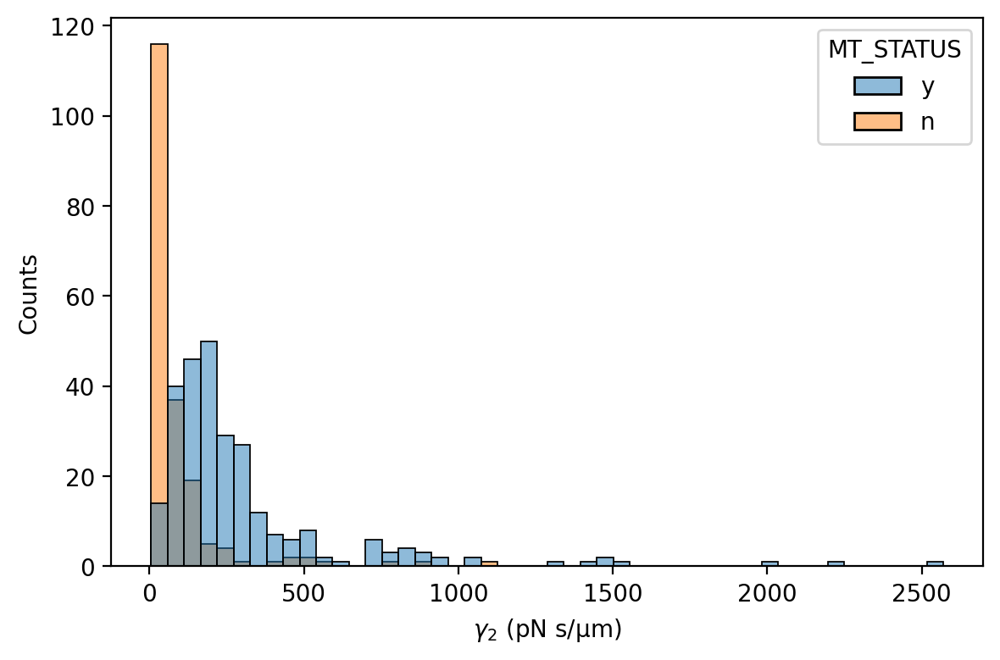

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


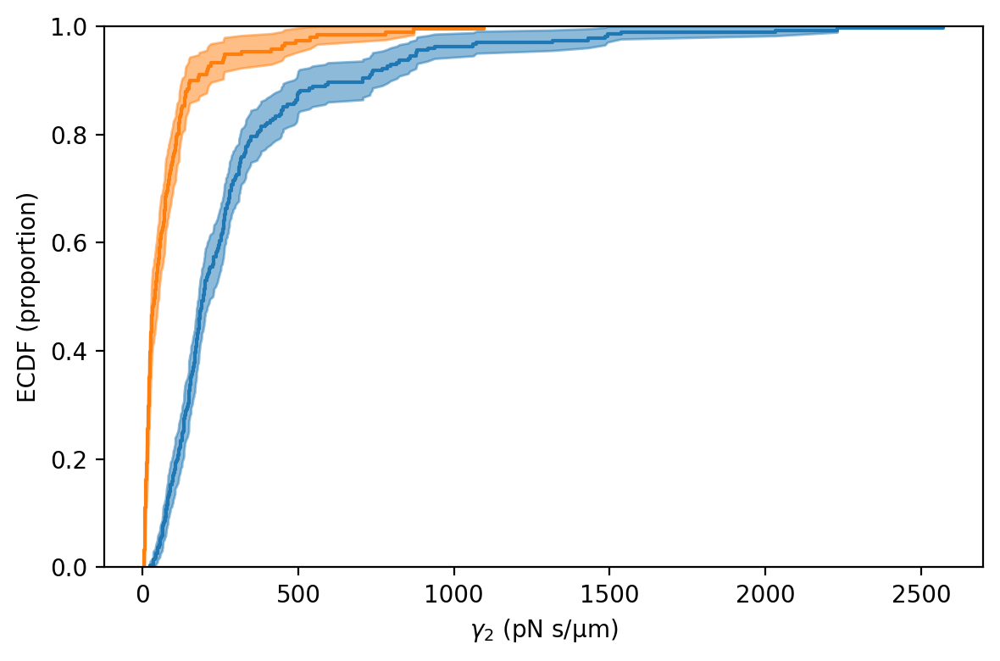

MannwhitneyuResult(statistic=np.float64(6477.0), pvalue=np.float64(9.820301114983683e-43))


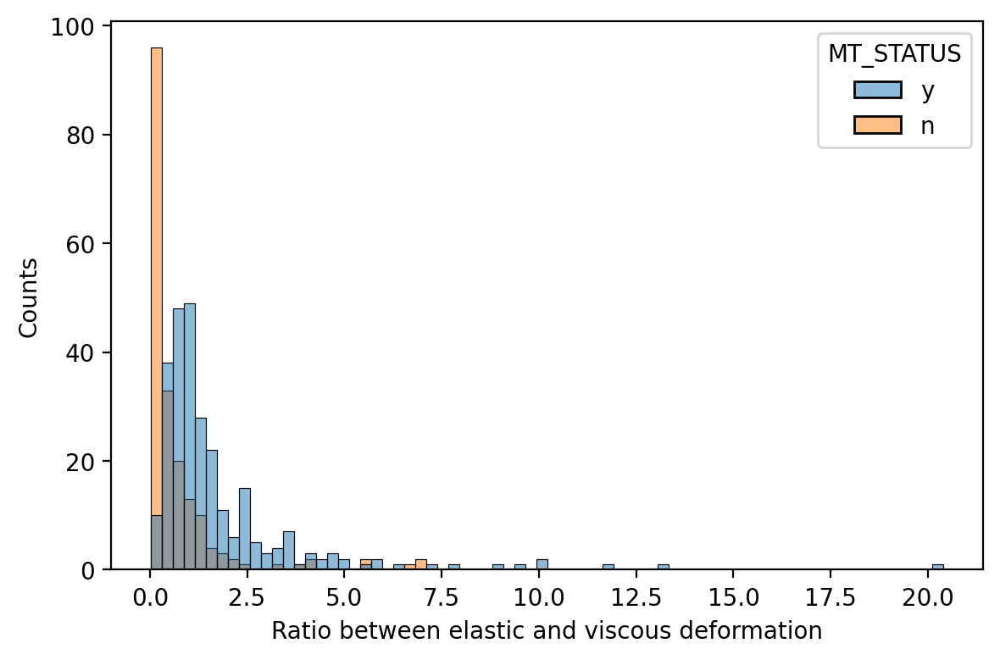

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


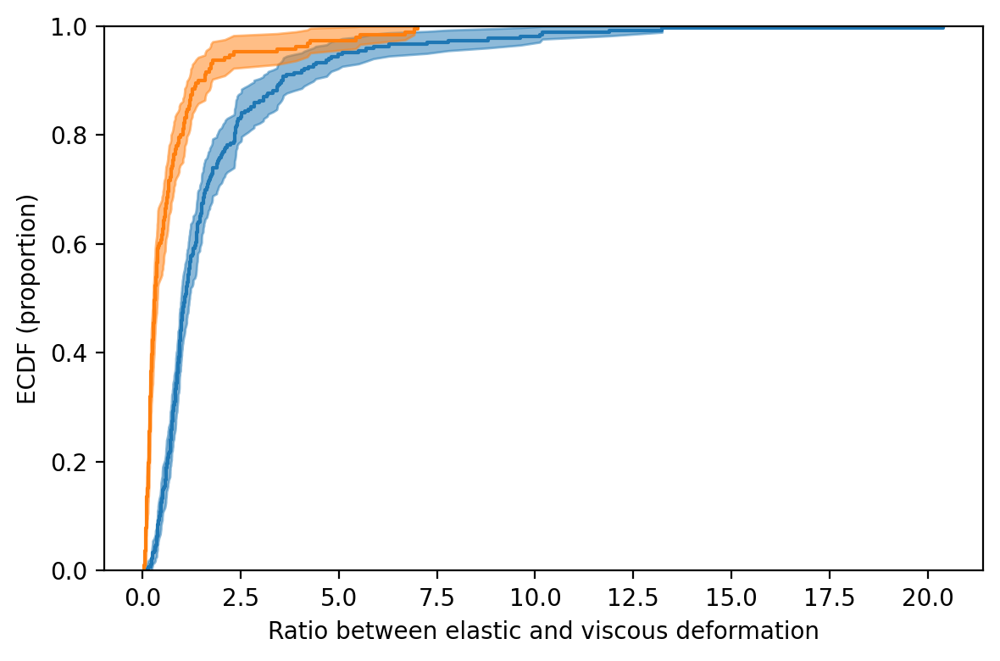

MannwhitneyuResult(statistic=np.float64(10000.0), pvalue=np.float64(3.9789669118381003e-29))


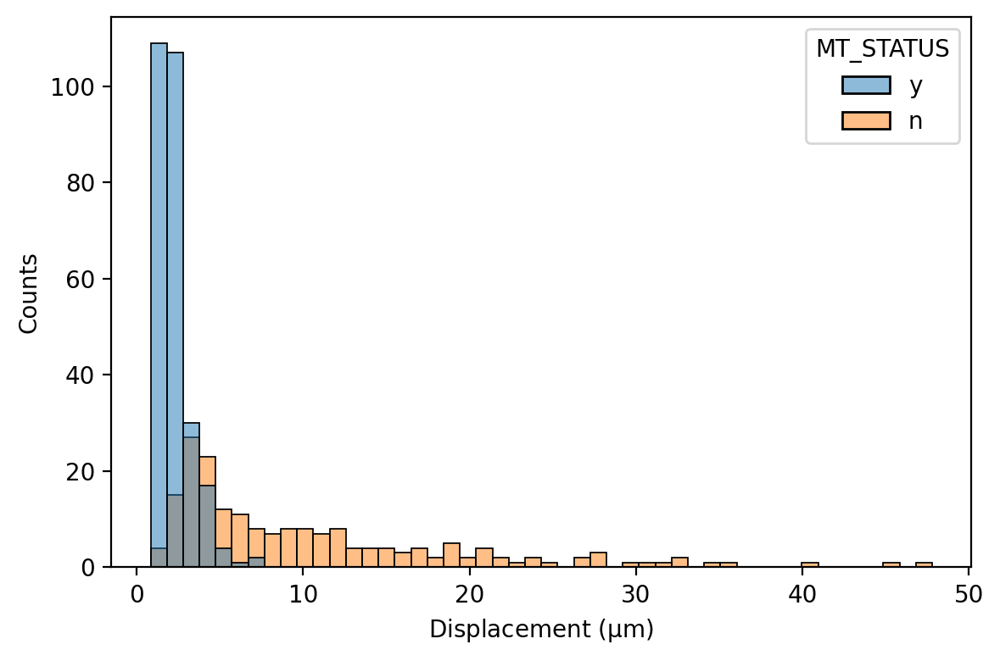

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


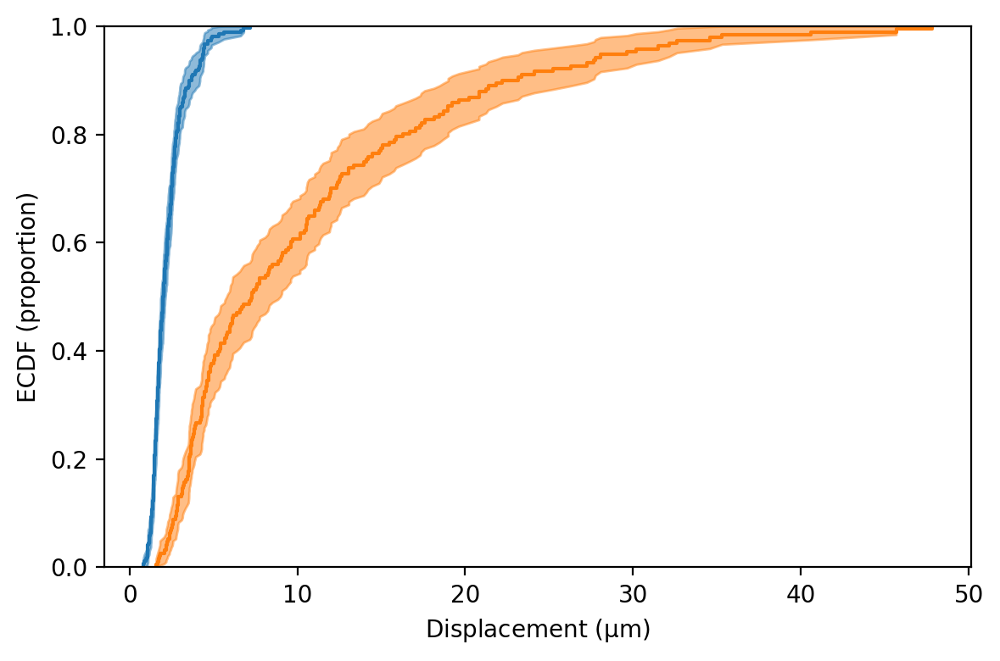

MannwhitneyuResult(statistic=np.float64(48026.0), pvalue=np.float64(4.0128965359018624e-56))


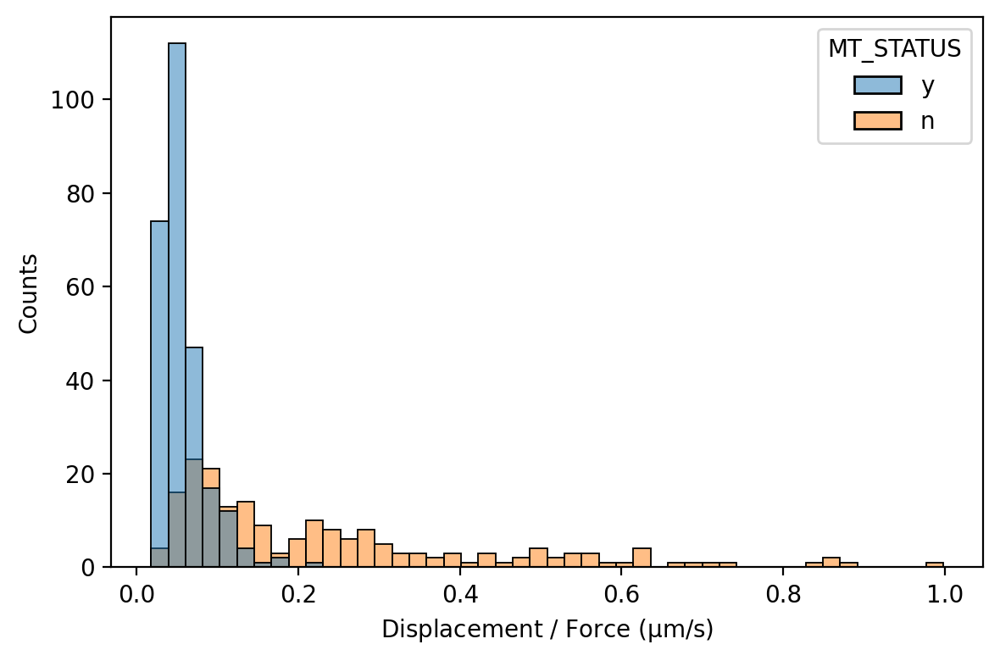

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


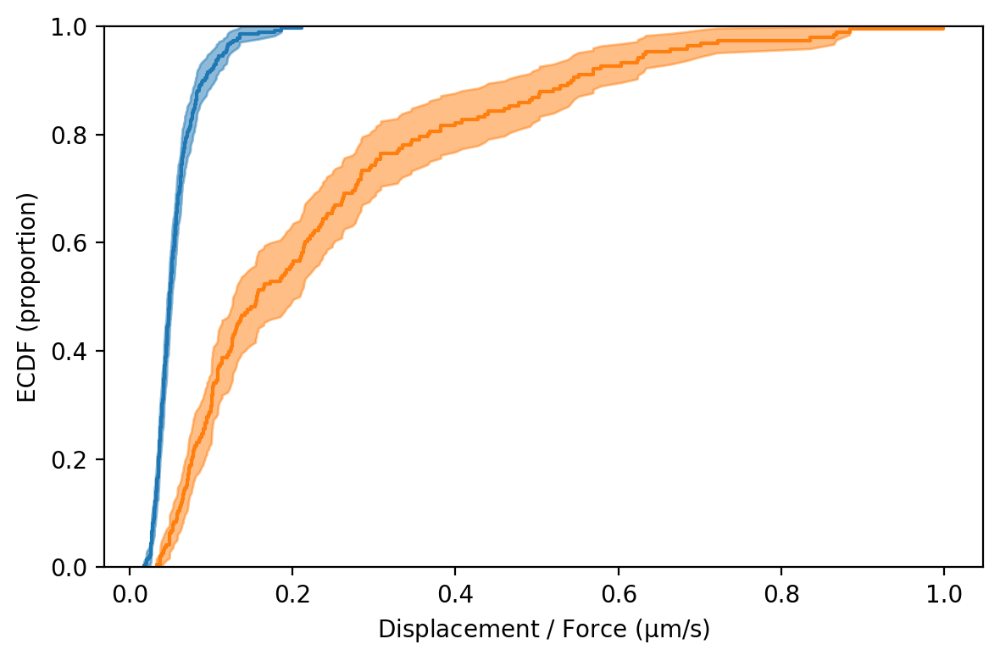

MannwhitneyuResult(statistic=np.float64(46543.0), pvalue=np.float64(4.047974671893357e-49))


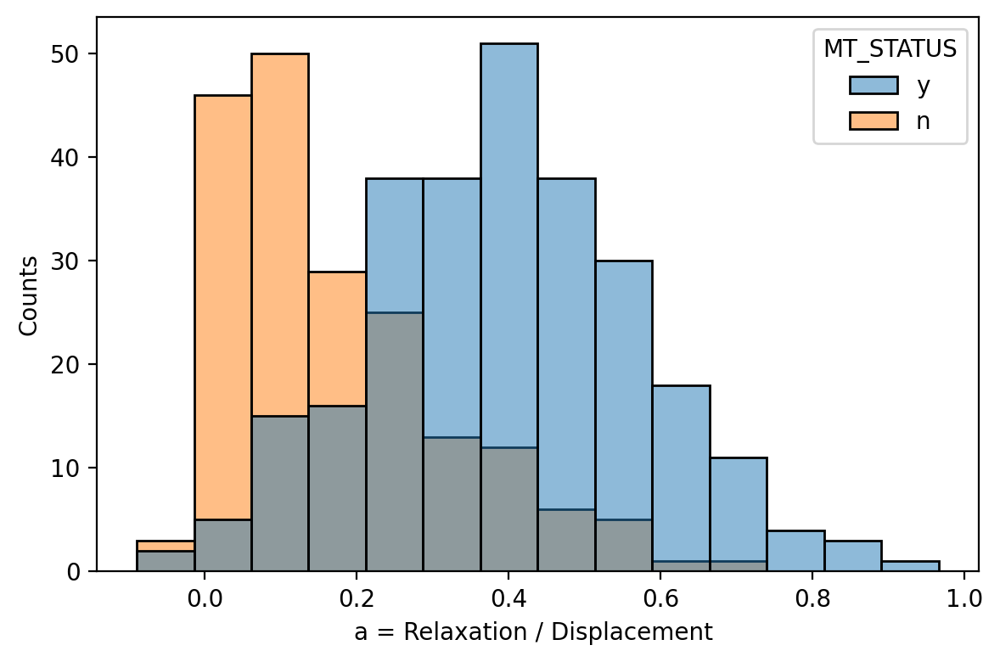

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


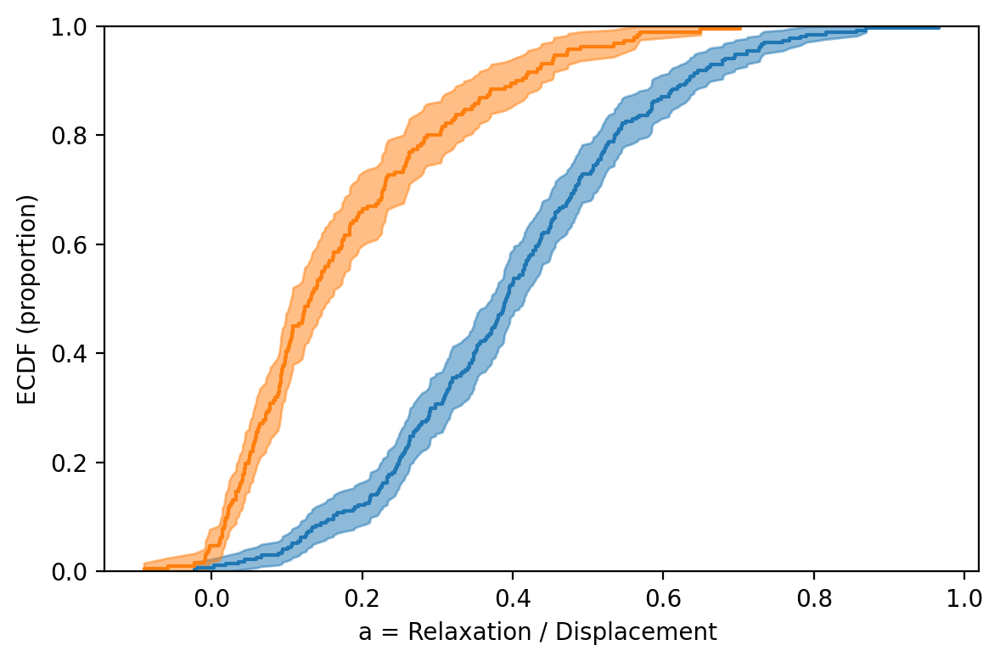

MannwhitneyuResult(statistic=np.float64(8675.0), pvalue=np.float64(6.286922956382639e-34))


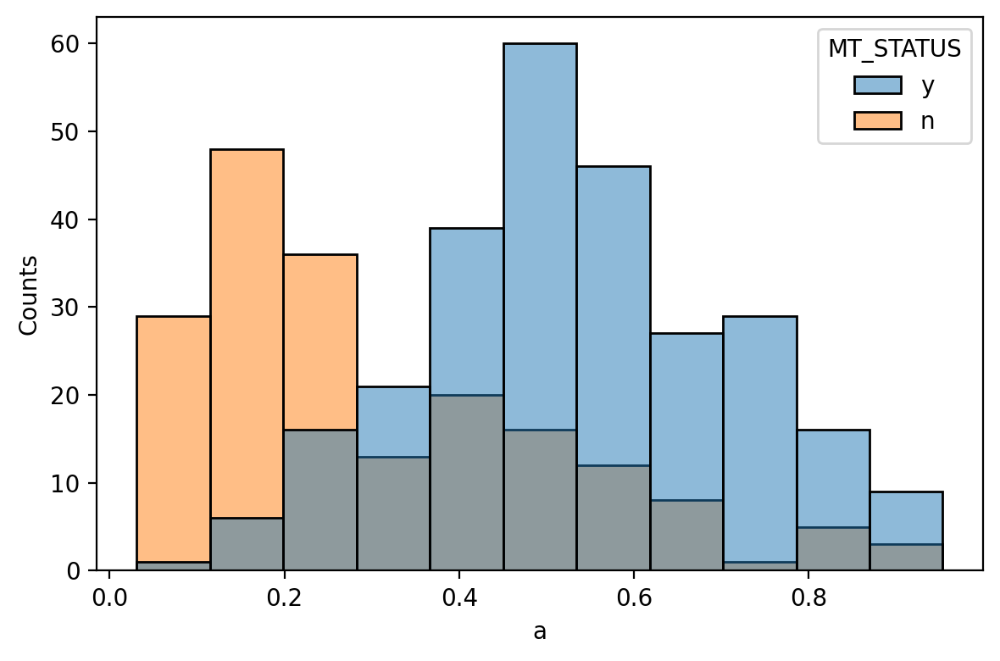

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


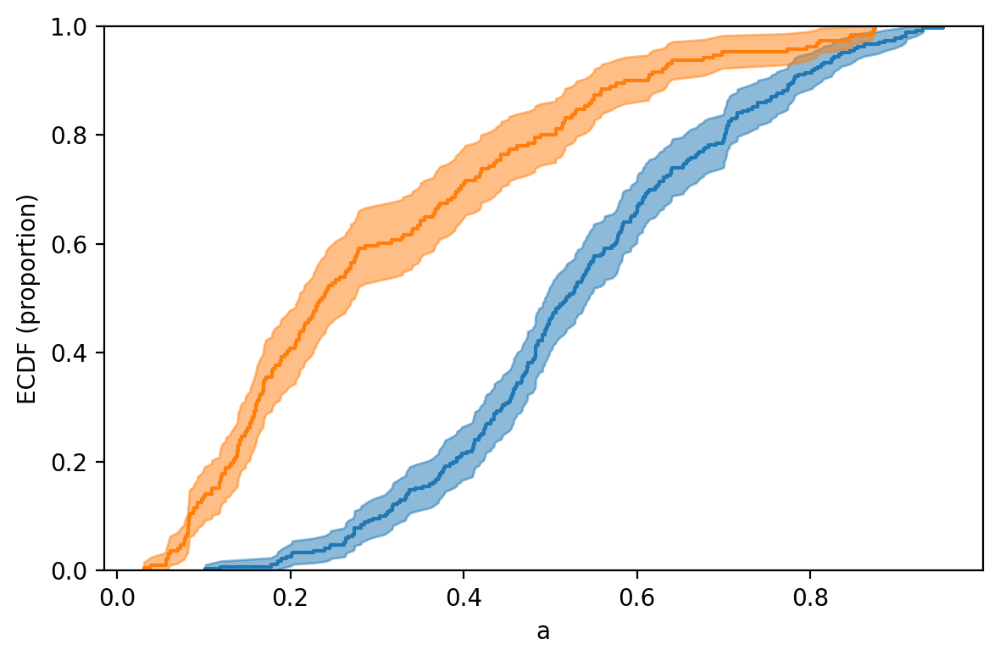

MannwhitneyuResult(statistic=np.float64(10000.0), pvalue=np.float64(3.9789669118381003e-29))


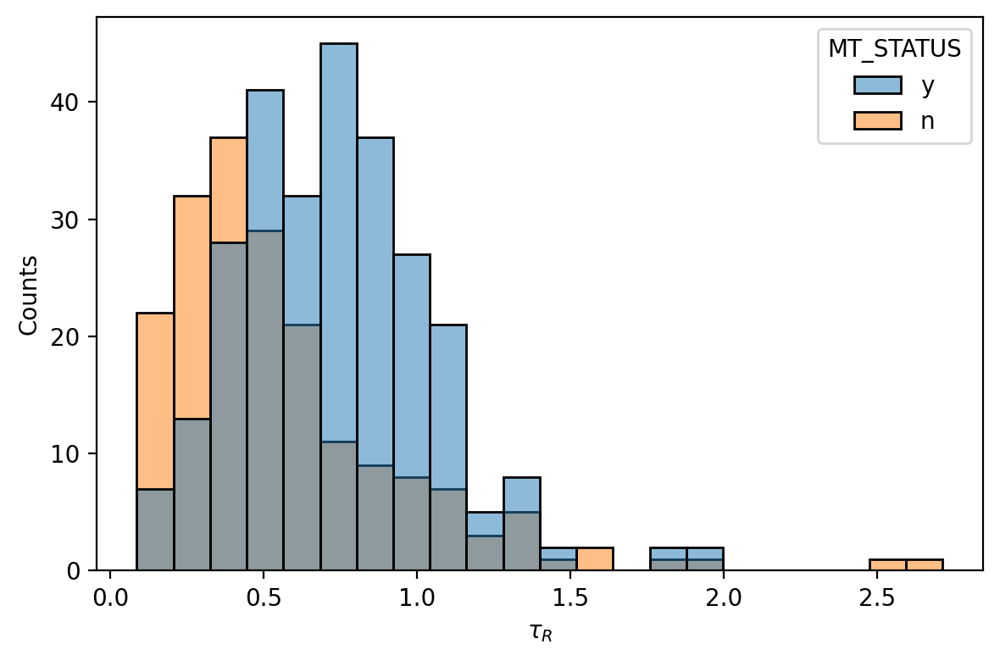

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:18: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_27714/2402415202.py:24: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


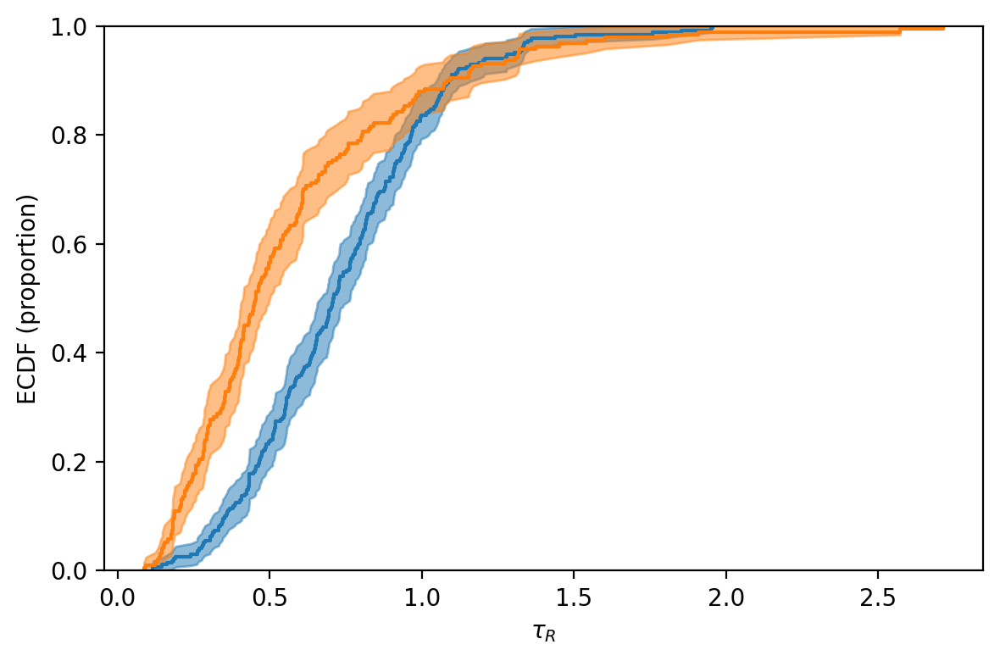

MannwhitneyuResult(statistic=np.float64(16230.0), pvalue=np.float64(1.195367835400482e-11))


In [84]:
from scipy.stats import ecdf, ttest_ind, mannwhitneyu


for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(6, 4), dpi=200)
    df_binned_force = df_results_filtered[(df_results_filtered['AVG_FORCE']>30)&(df_results_filtered['AVG_FORCE']<60)]
    sns.histplot(df_binned_force, x=param, hue='MT_STATUS')
    plt.xlabel(label)
    plt.ylabel('Counts')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_histogram_{param}.svg', format='svg')
    plt.show()

    fig = plt.figure(figsize=(6, 4), dpi=200)
    res = ecdf(df_binned_force.loc[df_binned_force['MT_STATUS']=='y', param].values)
    ecdf_data_x = df_binned_force.sort_values(by=param, ascending=True).loc[df_binned_force['MT_STATUS']=='y', param]
    sns.ecdfplot(x=res.cdf.quantiles, color=sns.color_palette()[0])
    ci = res.cdf.confidence_interval(confidence_level=0.95)
    plt.fill_between(res.cdf.quantiles, ci.low.probabilities, ci.high.probabilities, color=sns.color_palette()[0], alpha=0.5)

    res = ecdf(df_binned_force.loc[df_binned_force['MT_STATUS']=='n', param].values)
    ecdf_data_x = df_binned_force.sort_values(by=param, ascending=True).loc[df_binned_force['MT_STATUS']=='n', param]
    sns.ecdfplot(x=res.cdf.quantiles, color=sns.color_palette()[1])
    ci = res.cdf.confidence_interval(confidence_level=0.95)
    plt.fill_between(res.cdf.quantiles, ci.low.probabilities, ci.high.probabilities, color=sns.color_palette()[1], alpha=0.5)

    plt.ylabel('ECDF (proportion)')
    plt.xlabel(label)
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_ecdf_{param}.svg', format='svg')
    plt.show()

    res = mannwhitneyu(df_binned_force.loc[df_binned_force['MT_STATUS']=='n', param].values, 
                    df_binned_force.loc[df_binned_force['MT_STATUS']=='y', param].values)

    print(res)

# Confidence intervals and p values of parameters

In [85]:
df_data_stats = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).median(numeric_only=True).reset_index()
df_data_stats['group_size'] = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).size().values

rng = np.random.default_rng()
df_params_stats = pd.DataFrame()
p_values = dict()

def weighted_bootstrap(data, weights=None, n_resamples=1000, rng=None):
    if weights is None:
        weights = np.ones(len(data))
    
    bootstrap_samples = rng.choice(data, size=(n_resamples, len(data)), replace=True, p=weights/np.sum(weights))
    ci = np.percentile(bootstrap_samples, [2.5, 97.5])
    return ci


for param in params:
    df_binned_force = df_data_stats[(df_data_stats['AVG_FORCE']>30)&(df_data_stats['AVG_FORCE']<60)]
    for mt_status in ['y', 'n']:

        weights=df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, 'group_size'].values
        ci = weighted_bootstrap(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)
        weighted_average = np.average(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights)

        new_line = {'parameter': param, 
                    'weighted_average': weighted_average,
                    'conf_int_low': ci[0], 
                    'conf_int_high': ci[1],
                    'y_err_low': weighted_average - ci[0],
                    'y_err_high': ci[1] - weighted_average,
                    'MT_STATUS': mt_status
                    }
        df_params_stats = pd.concat([df_params_stats, pd.DataFrame(new_line, index=[0])])

    res = ttest_ind(df_binned_force.loc[df_binned_force['MT_STATUS']=='n', param].values, 
                    df_binned_force.loc[df_binned_force['MT_STATUS']=='y', param].values, equal_var=False)
    
    p_values[param] = res.pvalue


df_params_stats.head(20)
df_params_stats.to_csv(f'{dir_plots}/results/results_material_properies_stats.csv', index=False)

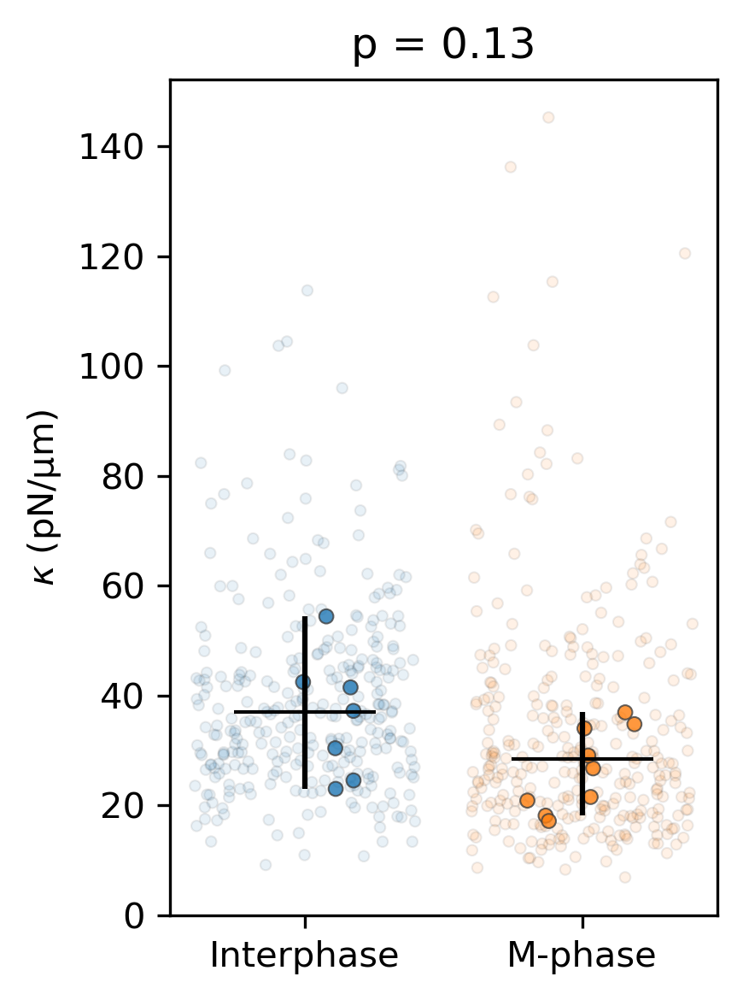

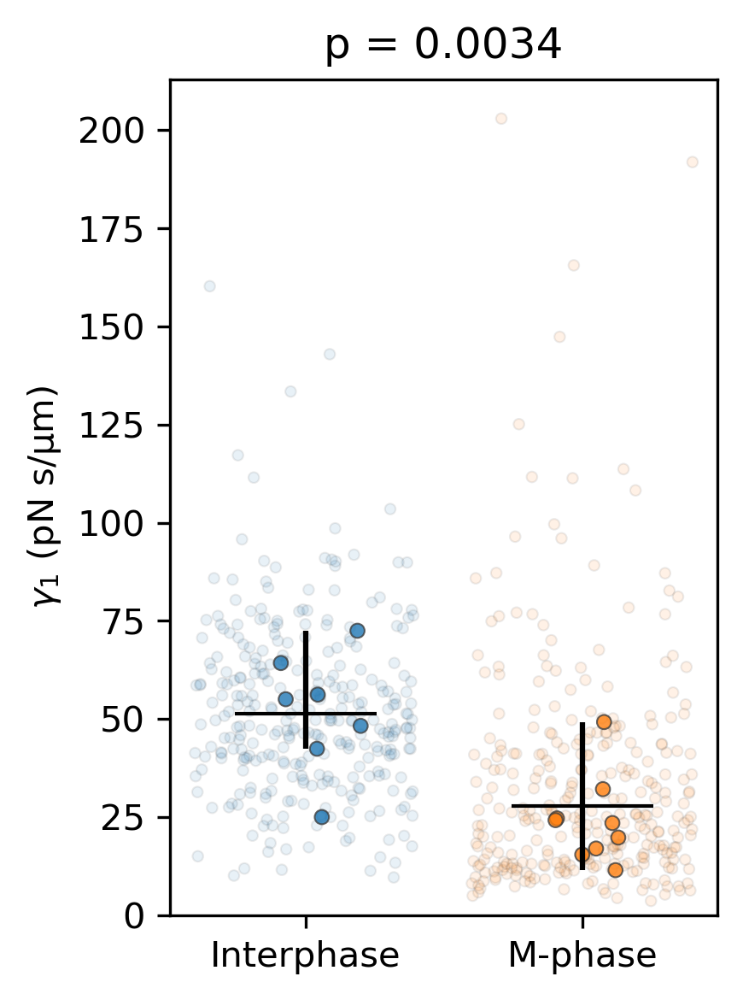

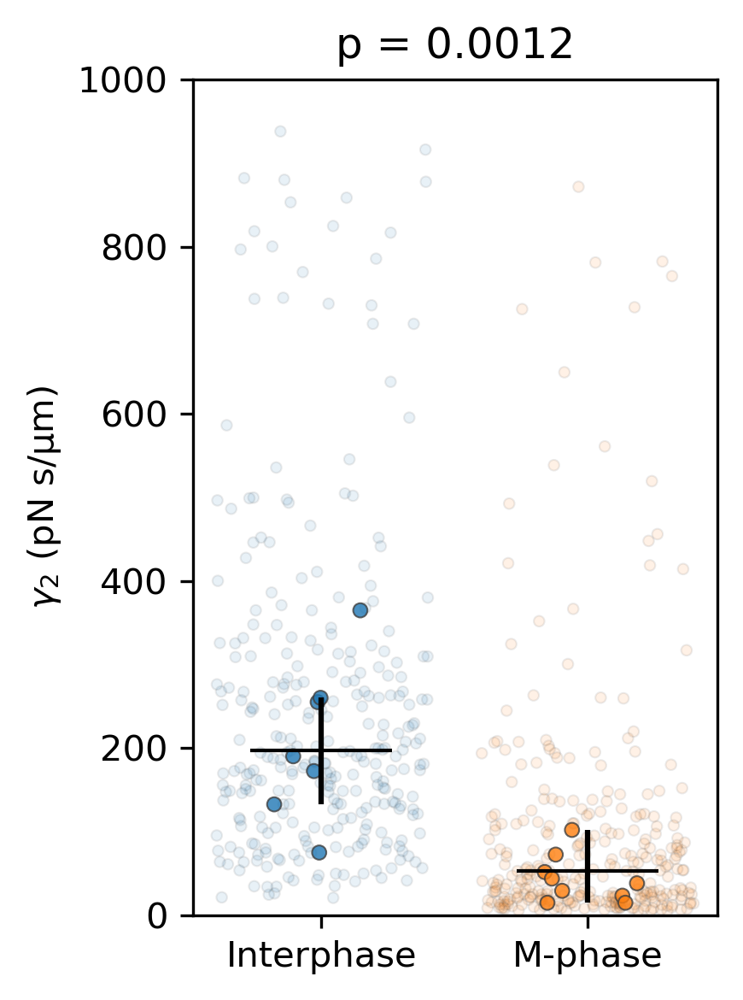

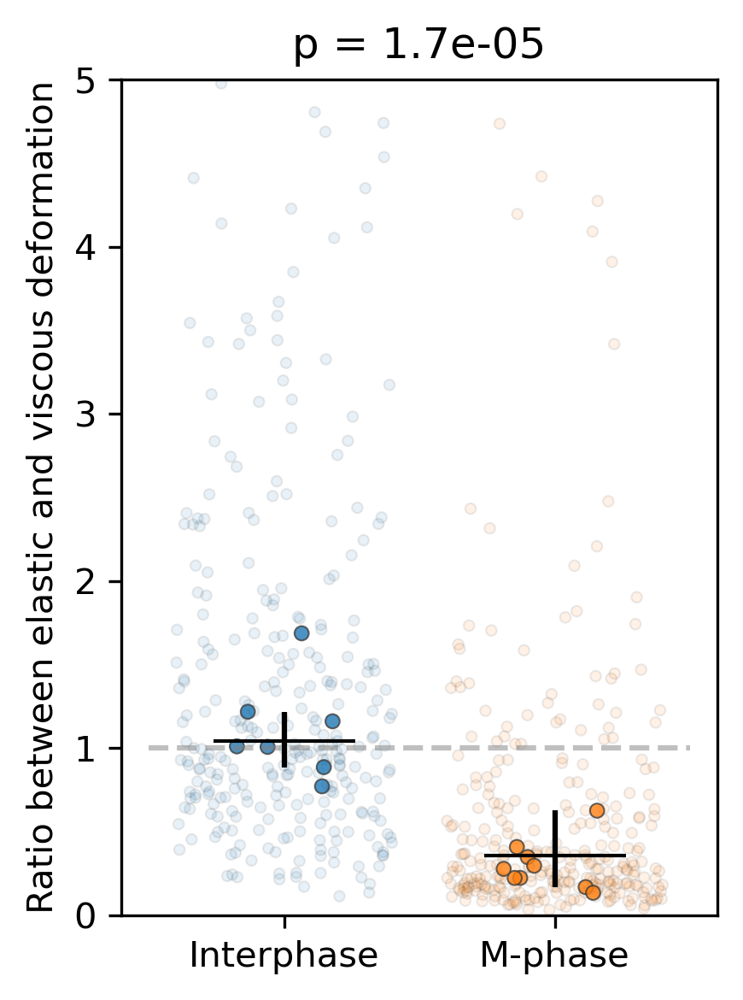

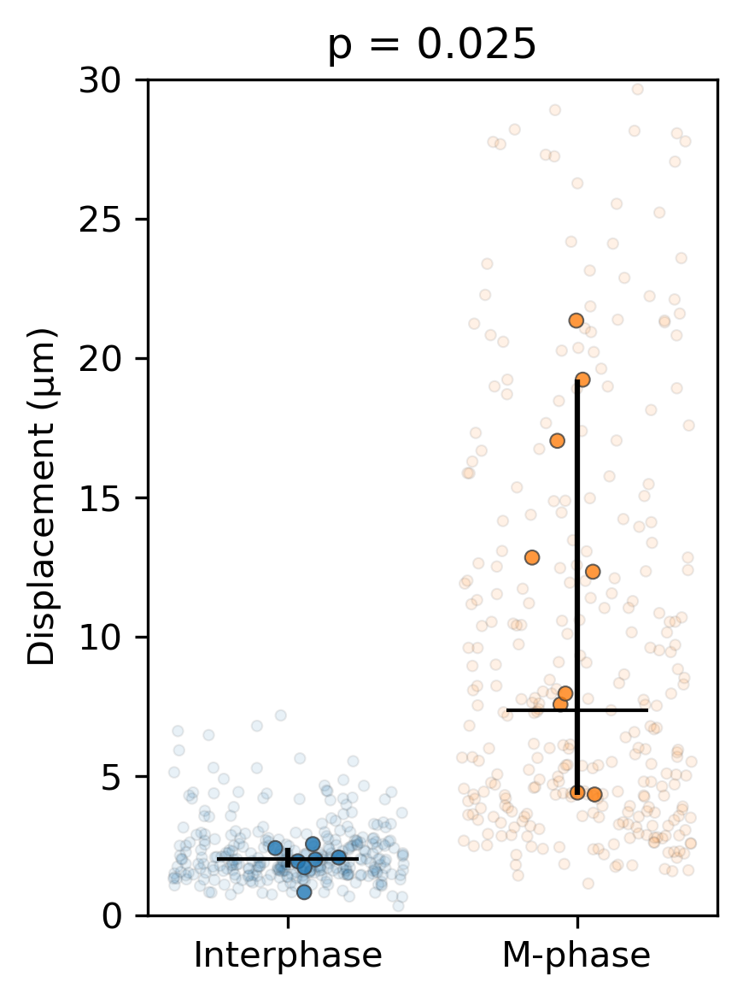

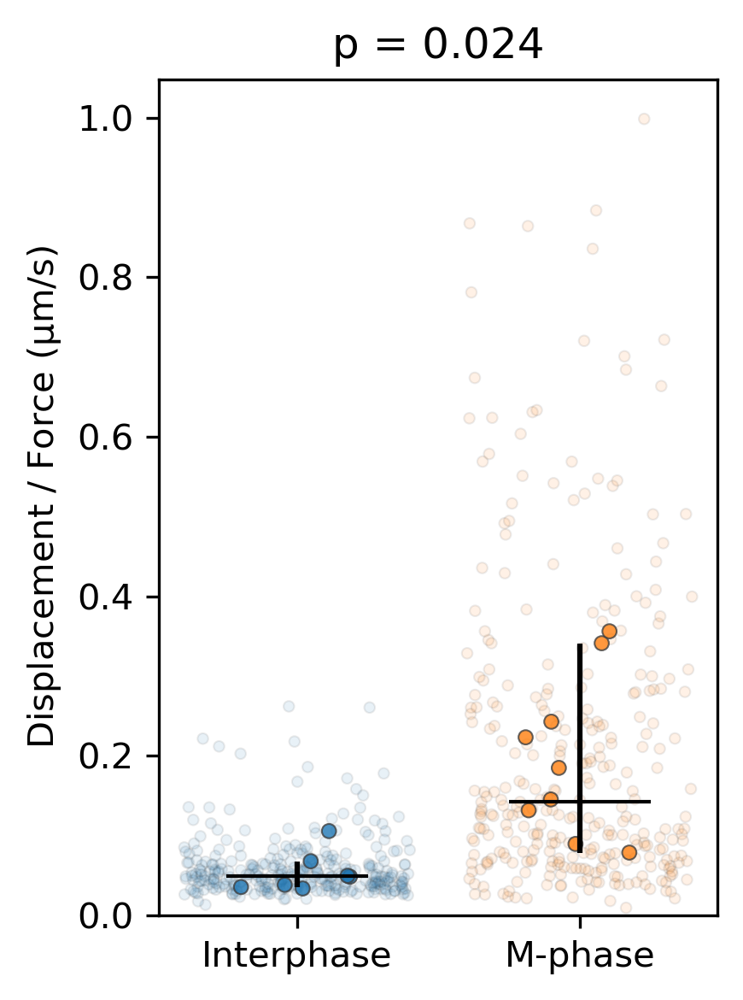

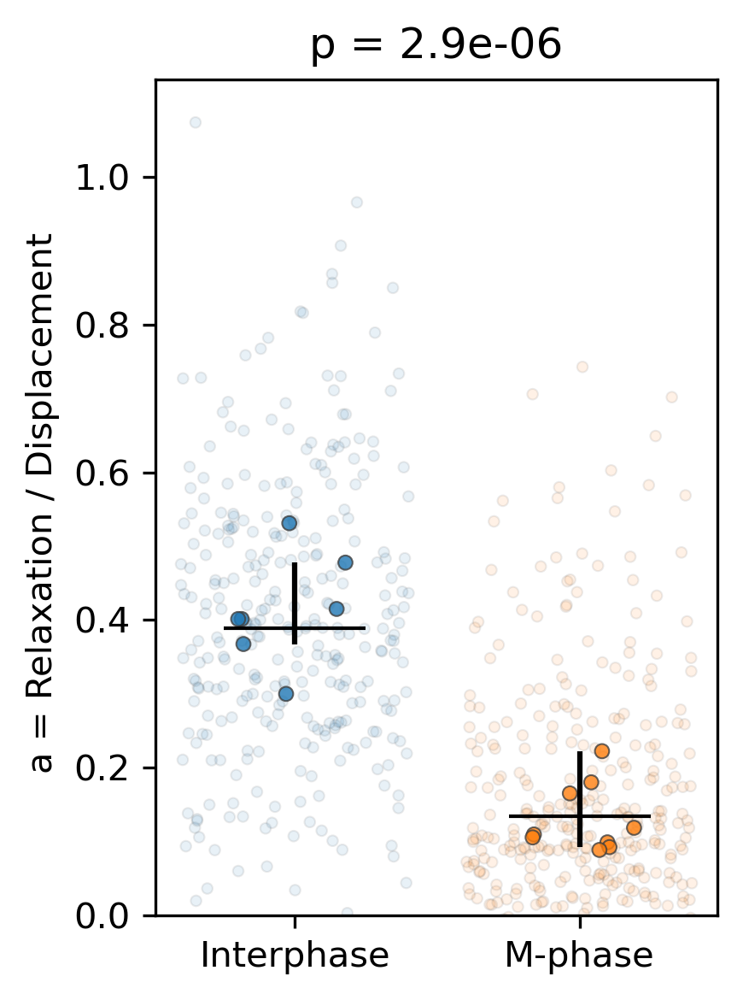

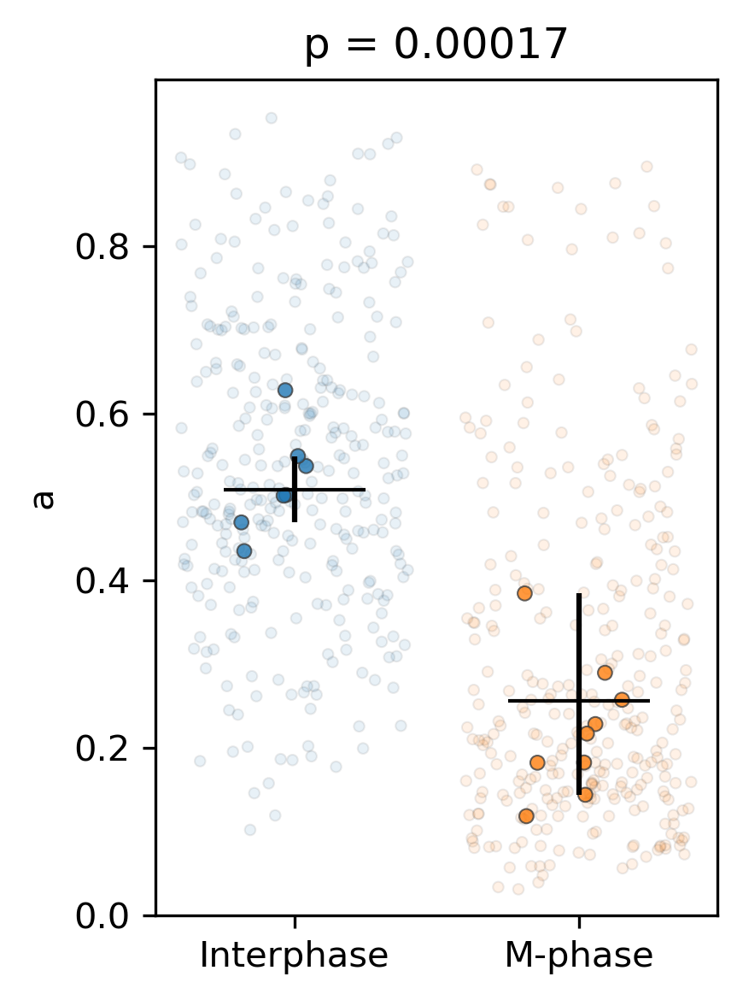

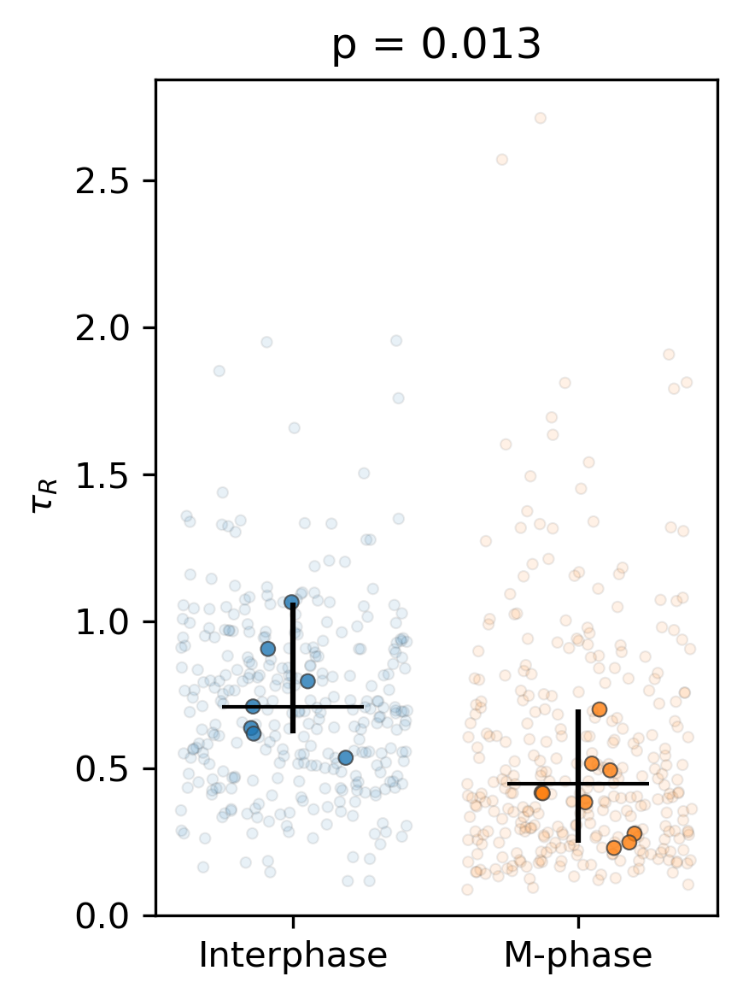

In [86]:
df_data_stats = df_data_stats.sort_values(by='MT_STATUS', ascending=False)
for (param, label) in zip(params, labels):
    p_value = p_values[param]
    fig = plt.figure(figsize=(3, 4), dpi=300)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, jitter=0.4, alpha=0.1, linewidth=0.5, legend=False, size=3, zorder=0)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_data_stats, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, zorder=1)

    plt.errorbar(df_params_stats.loc[df_params_stats['parameter']==param, 'MT_STATUS'], 
                 df_params_stats.loc[df_params_stats['parameter']==param, 'weighted_average'], 
                 yerr=np.array([df_params_stats.loc[df_params_stats['parameter']==param, 'y_err_low'].values, df_params_stats.loc[df_params_stats['parameter']==param, 'y_err_high'].values]), 
                 marker = '_', markersize=40,  color='k', linestyle='', zorder=2)

    plt.title(f'p = {p_value:.2g}')
    plt.ylabel(label)
    plt.xlabel('')
    plt.ylim(bottom=0)
    plt.xticks(ticks = ['y', 'n'], labels=['Interphase', 'M-phase'])
    if param == 'eta_2':
        plt.ylim(bottom=0, top=1000)
    elif param == 'elastic_viscous_ratio':
        plt.ylim(bottom=0, top=5)
        plt.hlines(1, -0.5, 1.5, color='gray', linestyle='--', alpha=0.5)
    elif param == 'rising_dif':
        plt.ylim(bottom=0, top=30)
    # elif param == 'relative_dif':
    #     plt.ylim(bottom=0, top=1)

    # plt.yscale('log')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_{param}.svg', format='svg')
    plt.show()

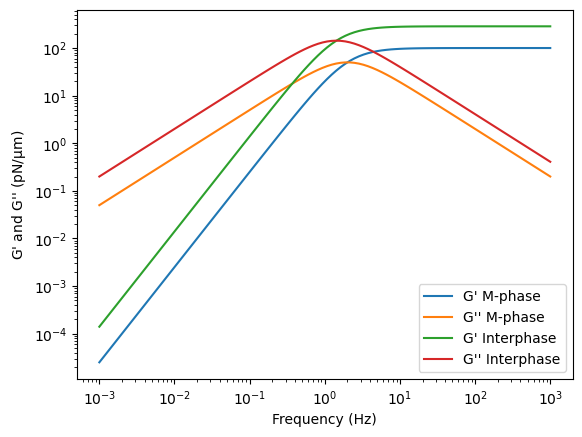

In [87]:
# predicting the G' and G'' from the parameters

freq = np.logspace(-3, 3, num=100)
G = np.zeros((len(freq), 2))

for (tau, eta, phase) in zip([0.5, 0.7], [50, 200], ['M-phase', 'Interphase']):
    for i in range(len(freq)):
        G[i, 0] = freq[i]**2*tau* eta / (1 + (freq[i]*tau)**2)
        G[i, 1] = freq[i] * eta / (1 + (freq[i]*tau)**2)

    plt.plot(freq, G[:, 0], label=f'G\' {phase}')
    plt.plot(freq, G[:, 1], label=f'G\'\' {phase}')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('G\' and G\'\' (pN/$\\mathrm{\\mu m}$)')
plt.legend()
plt.show()